In [1]:
import numpy as np
import pandas as pd

books = pd.read_csv("Books.csv", low_memory=False)
users = pd.read_csv("Users.csv")
ratings = pd.read_csv("Ratings.csv")


In [2]:

# Merge books and ratings on 'ISBN' column
merged_df = pd.merge(books, ratings, on='ISBN', how='inner')

# Merge merged_df and users on 'User-ID' column
merged_df = pd.merge(merged_df, users, on='User-ID', how='inner')

# Now merged_df contains all the data merged into a single DataFrame

# Optional: If you want to save the merged DataFrame to a new CSV file
merged_df.to_csv('MergedData.csv', index=False)

# Print the first few rows of the merged DataFrame to verify the merge
print(merged_df.head())

         ISBN                                         Book-Title  \
0  0195153448                                Classical Mythology   
1  0002005018                                       Clara Callan   
2  0060973129                               Decision in Normandy   
3  0374157065  Flu: The Story of the Great Influenza Pandemic...   
4  0393045218                             The Mummies of Urumchi   

            Book-Author Year-Of-Publication                   Publisher  \
0    Mark P. O. Morford                2002     Oxford University Press   
1  Richard Bruce Wright                2001       HarperFlamingo Canada   
2          Carlo D'Este                1991             HarperPerennial   
3      Gina Bari Kolata                1999        Farrar Straus Giroux   
4       E. J. W. Barber                1999  W. W. Norton &amp; Company   

                                         Image-URL-S  \
0  http://images.amazon.com/images/P/0195153448.0...   
1  http://images.amazon.com/

In [3]:
# Remove the columns 'Image-URL-L' and 'Image-URL-M' and 'Image-URL-S' from the dataframe

merged_df = merged_df.drop(['Image-URL-L', 'Image-URL-M', 'Image-URL-S'], axis=1)

print(merged_df)

               ISBN                                         Book-Title  \
0        0195153448                                Classical Mythology   
1        0002005018                                       Clara Callan   
2        0060973129                               Decision in Normandy   
3        0374157065  Flu: The Story of the Great Influenza Pandemic...   
4        0393045218                             The Mummies of Urumchi   
...             ...                                                ...   
1031131  087004124X                                             Anthem   
1031132  158243123X                               A Student of Weather   
1031133  8485900057            Rimas y leyendas (ClÃ¡sicos Fraile ; 3)   
1031134  0838934854                   Anglo-American Cataloguing Rules   
1031135  3423300965                                   Texte zur Ethik.   

                     Book-Author Year-Of-Publication  \
0             Mark P. O. Morford                2002   

In [4]:
# Columns and dtypes

merged_df.dtypes

ISBN                    object
Book-Title              object
Book-Author             object
Year-Of-Publication     object
Publisher               object
User-ID                  int64
Book-Rating              int64
Location                object
Age                    float64
dtype: object

In [5]:
### Why Age is float. ?
### Get some few FLoat values in Age Colums

unique_float_values = merged_df['Age'].unique()
print(unique_float_values)

[ 18.  nan  49.  30.  36.  29.  60.  27.  71.  40.  53.  65.  46.  47.
  26.  56.  37.  39.  25.  31.  41.  20.  58.  42.  38.  52.  21.  22.
  34.  33.  19.  57.  51.  48.  35.  32.  62.  45.  74.  44.  43.  68.
  54.  55.  24.  59.  28.  70.  17.  23.  14.  50.  16.  61.  15.  66.
  67. 116.  84.  82.   9.  72.  81.  64.  13.  75.  76. 128.  69.  73.
 104.  63.   0.  77.  79.   7. 239. 103.  12. 201. 204.  90.  80.   2.
  85.   3.   1.   4.  78.  83. 151.   8. 100. 148.  93.  11. 209.  10.
 147. 101. 168. 152. 133.  97.   5. 136.  86.  99.  92. 228. 141. 237.
 108.  96. 146. 140. 223. 219. 124.  94. 200. 220. 244. 212. 157. 229.
 105.   6. 199. 226. 123. 118. 127. 114. 156. 138. 109.  89.  95. 132.
 107.  98.]


In [6]:
print(merged_df.describe())

            User-ID   Book-Rating            Age
count  1.031136e+06  1.031136e+06  753301.000000
mean   1.405945e+05  2.839051e+00      37.397648
std    8.052466e+04  3.854157e+00      14.098254
min    2.000000e+00  0.000000e+00       0.000000
25%    7.041500e+04  0.000000e+00      28.000000
50%    1.412100e+05  0.000000e+00      35.000000
75%    2.114260e+05  7.000000e+00      45.000000
max    2.788540e+05  1.000000e+01     244.000000


<span style="font-family: 'Times New Roman'; font-size: 35px">2.Visualization </span>


<span style="font-family: 'Times New Roman'; font-size: 20px">2.1 Age distribution of Histogram </span>

<span style="font-family: 'Times New Roman'; font-size: 18px">2.1.a Histogram with outliers </span>

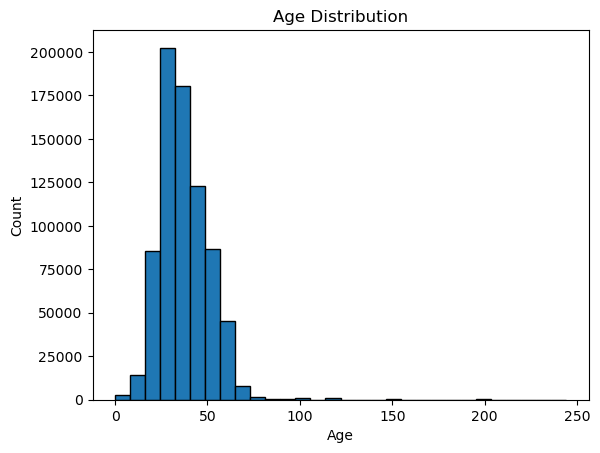

In [7]:
##Normal Age Histogram

import matplotlib.pyplot as plt
plt.hist(merged_df['Age'].dropna(), bins=30, edgecolor='black')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.1.b Histogram after removing outliers</span>

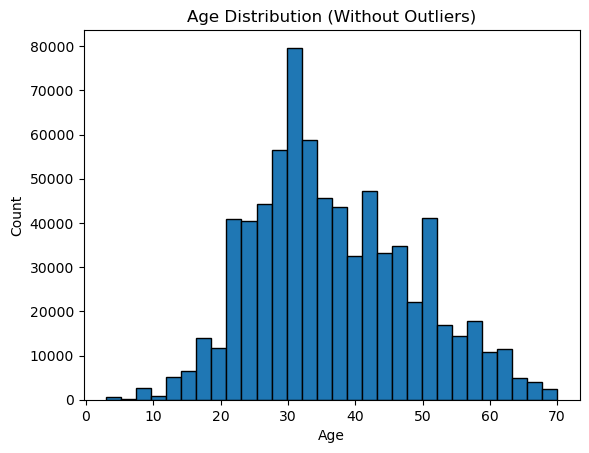

In [8]:
# Histogram after removing outliers 

import matplotlib.pyplot as plt
import numpy as np

# Calculate IQR
Q1 = merged_df['Age'].quantile(0.25)
Q3 = merged_df['Age'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds to filter out outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out rows where 'Age' is within the bounds
filtered_age = merged_df[(merged_df['Age'] >= lower_bound) & (merged_df['Age'] <= upper_bound)]['Age']

# Plot histogram for filtered 'Age' values
plt.hist(filtered_age.dropna(), bins=30, edgecolor='black')
plt.title('Age Distribution (Without Outliers)')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

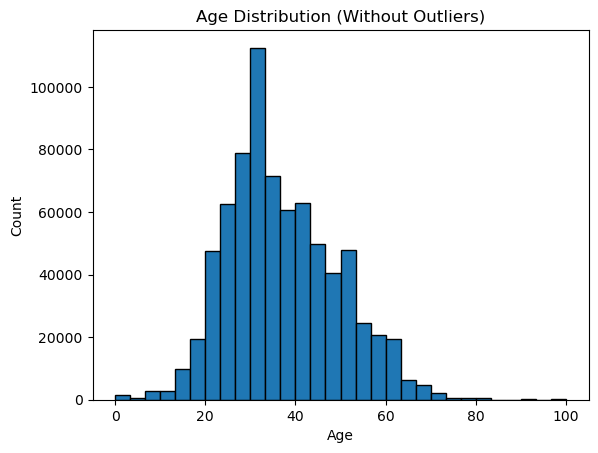

In [9]:
# Histogram after removing outliers 

import matplotlib.pyplot as plt
import numpy as np

# Calculate IQR
Q1 = merged_df['Age'].quantile(0.10)
Q3 = merged_df['Age'].quantile(0.90)
IQR = Q3 - Q1

# Define lower and upper bounds to filter out outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out rows where 'Age' is within the bounds
filtered_age = merged_df[(merged_df['Age'] >= lower_bound) & (merged_df['Age'] <= upper_bound)]['Age']

# Plot histogram for filtered 'Age' values
plt.hist(filtered_age.dropna(), bins=30, edgecolor='black')
plt.title('Age Distribution (Without Outliers)')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.2 Age for each count </span>

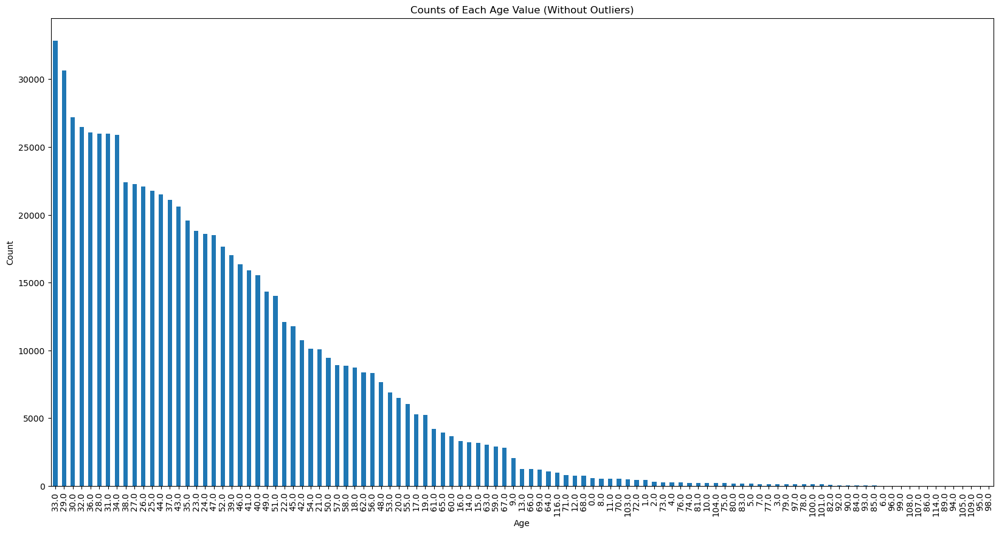

In [10]:
import matplotlib.pyplot as plt

# Calculate IQR
Q1 = merged_df['Age'].quantile(0.05)
Q3 = merged_df['Age'].quantile(0.95)
IQR = Q3 - Q1

# Define lower and upper bounds to filter out outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out rows where 'Age' is within the bounds
filtered_age = merged_df[(merged_df['Age'] >= lower_bound) & (merged_df['Age'] <= upper_bound)]['Age']

# Count occurrences of each unique 'Age' value
age_counts = filtered_age.value_counts()

# Set figure size (width, height) in inches
plt.figure(figsize=(20, 10))  # Adjust width and height according to your preference


# Plot bar graph for 'Age' values
age_counts.plot(kind='bar')
plt.title('Counts of Each Age Value (Without Outliers)')
plt.xlabel('Age')
plt.ylabel('Count')
plt.show()

####### Age Count - Derive Unique Users/UserId - > Age count

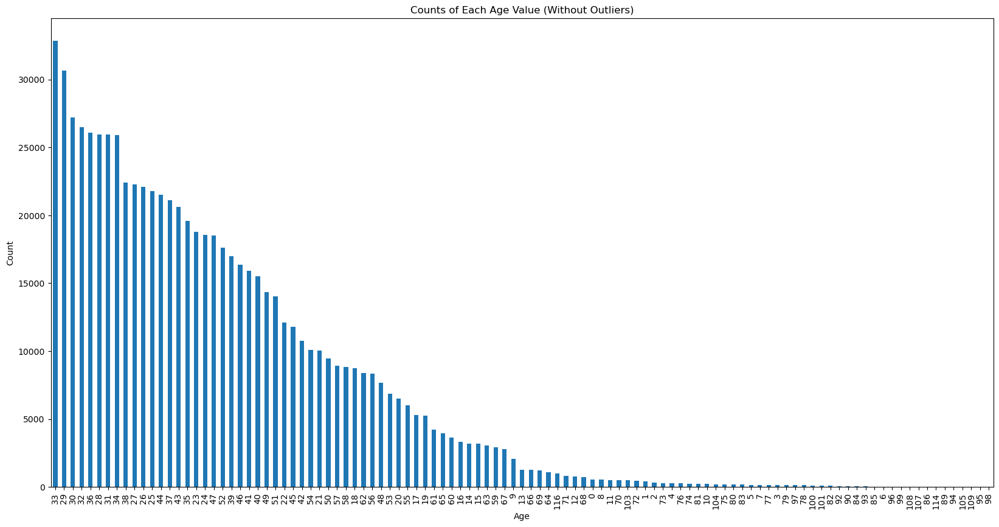

In [11]:
import copy

copied_df = copy.deepcopy(merged_df)

# Convert float values in 'Age' column to integers without changing NaN values
copied_df['Age'] = copied_df['Age'].apply(lambda x: int(x) if not pd.isna(x) else x)

import matplotlib.pyplot as plt

# Calculate IQR
Q1 = copied_df['Age'].quantile(0.05)
Q3 = copied_df['Age'].quantile(0.95)
IQR = Q3 - Q1

# Define lower and upper bounds to filter out outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out rows where 'Age' is within the bounds
filtered_age = copied_df[(merged_df['Age'] >= lower_bound) & (copied_df['Age'] <= upper_bound)]['Age']

# Count occurrences of each unique 'Age' value
age_counts = filtered_age.value_counts()

# Set figure size (width, height) in inches
plt.figure(figsize=(20, 10))  # Adjust width and height according to your preference


# Plot bar graph for 'Age' values
age_counts.plot(kind='bar')
plt.title('Counts of Each Age Value (Without Outliers)')
plt.xlabel('Age')
plt.ylabel('Count')

plt.xticks(range(len(age_counts.index)), age_counts.index.astype(int))

plt.show()

<span style="font-family: 'Times New Roman'; font-size: 35px">2.3 Bar Chart </span>

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.1 To Uppercase and replace space </span>

In [12]:
# Convert "Location" column to uppercase to maintain common standard and remove spaces
merged_df['Location'] = merged_df['Location'].str.upper().str.replace(' ', '')


<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.2.a Bar Chart: Location according to user count(Vertical) </span>

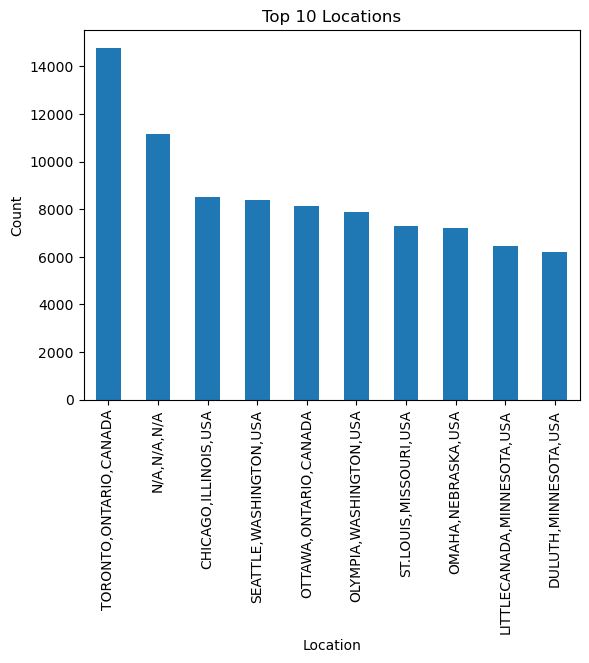

In [13]:
top_locations = merged_df['Location'].value_counts().head(10)
top_locations.plot(kind='bar')
plt.title('Top 10 Locations')
plt.xlabel('Location')
plt.ylabel('Count')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.3.b Bar Chart: Top 10 Location(without spliting column) (Horizontal)</span>

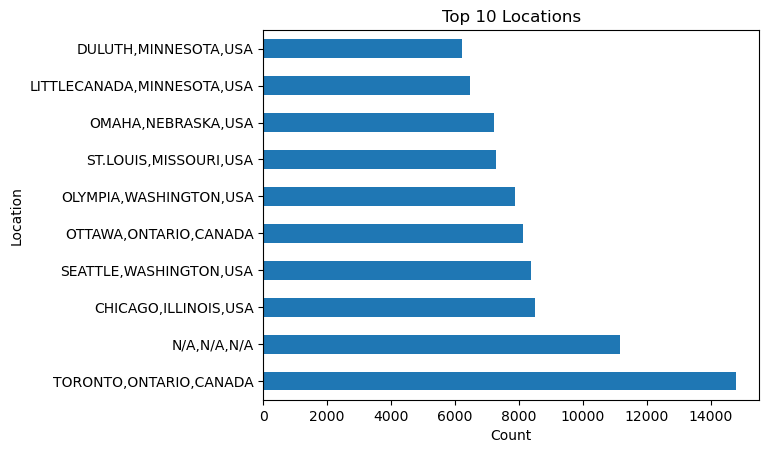

In [14]:
import matplotlib.pyplot as plt

# Get the top 10 locations
top_locations = merged_df['Location'].value_counts().head(10)

# Create a horizontal bar chart
top_locations.plot(kind='barh')
plt.title('Top 10 Locations')
plt.xlabel('Count')
plt.ylabel('Location')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.4 Splite Location Column </span>

In [15]:
# Split the "Location" column into "Locality", "State", and "Country"
location_split = merged_df['Location'].str.split(',', expand=True)

# Assign the separated values to new columns
merged_df['Locality'] = location_split[0]
merged_df['State'] = location_split[1]
merged_df['Country'] = location_split[2]

# Print the first few rows to verify the separation
print(merged_df.head())

         ISBN                                         Book-Title  \
0  0195153448                                Classical Mythology   
1  0002005018                                       Clara Callan   
2  0060973129                               Decision in Normandy   
3  0374157065  Flu: The Story of the Great Influenza Pandemic...   
4  0393045218                             The Mummies of Urumchi   

            Book-Author Year-Of-Publication                   Publisher  \
0    Mark P. O. Morford                2002     Oxford University Press   
1  Richard Bruce Wright                2001       HarperFlamingo Canada   
2          Carlo D'Este                1991             HarperPerennial   
3      Gina Bari Kolata                1999        Farrar Straus Giroux   
4       E. J. W. Barber                1999  W. W. Norton &amp; Company   

   User-ID  Book-Rating                 Location   Age  Locality       State  \
0        2            0  STOCKTON,CALIFORNIA,USA  18.0  STOC

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.4.a Bar Chart after split: Localities </span>

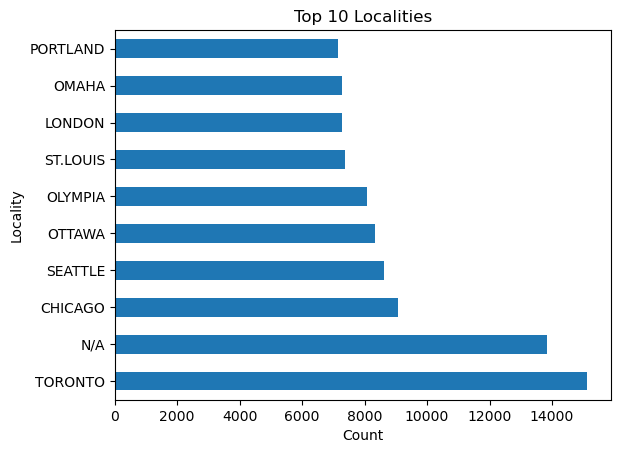

In [16]:
import matplotlib.pyplot as plt

# Get the top 10 Localities
top_locations = merged_df['Locality'].value_counts().head(10)

# Create a horizontal bar chart
top_locations.plot(kind='barh')
plt.title('Top 10 Localities')
plt.xlabel('Count')
plt.ylabel('Locality')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.4.b Bar Chart: Localities after splite :State </span>

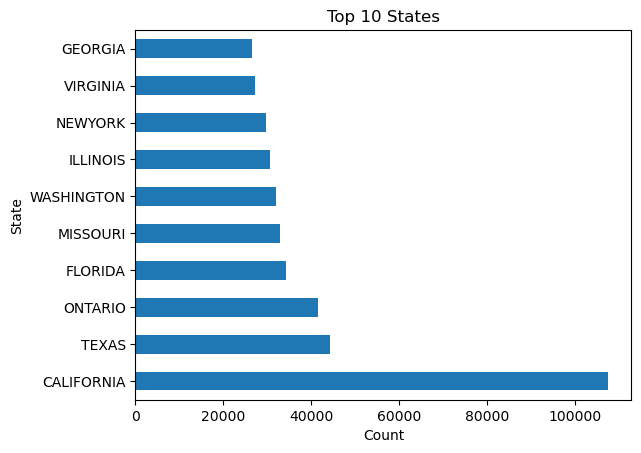

In [17]:
import matplotlib.pyplot as plt

# Get the top 10 Localities
top_locations = merged_df['State'].value_counts().head(10)

# Create a horizontal bar chart
top_locations.plot(kind='barh')
plt.title('Top 10 States')
plt.xlabel('Count')
plt.ylabel('State')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.3.4.c Bar Chart after split :Country </span>

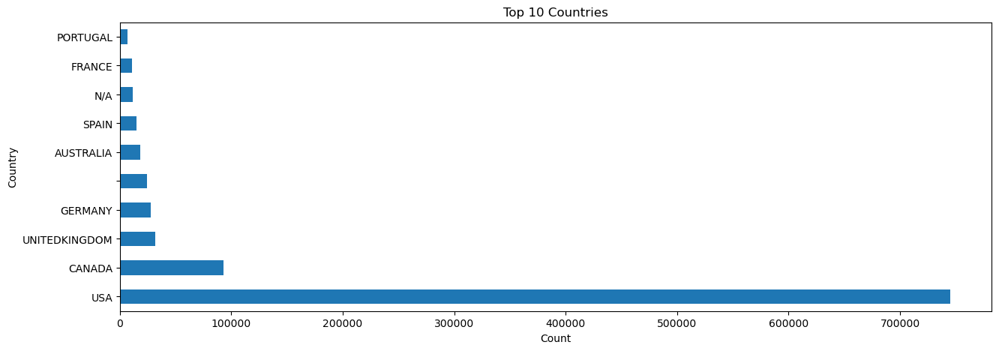

In [18]:
import matplotlib.pyplot as plt

# Get the top 10 Localities
top_locations = merged_df['Country'].value_counts().head(10)

# Set figure size (width, height) in inches
plt.figure(figsize=(15, 5))  # Adjust width and height according to your preference

# Create a horizontal bar chart
top_locations.plot(kind='barh')
plt.title('Top 10 Countries')
plt.xlabel('Count')
plt.ylabel('Country')
plt.show()


<span style="font-family: 'Times New Roman'; font-size: 35px">2.4 BIVARIATE Numerical-Numerical Variables
 </span>

<span style="font-family: 'Times New Roman'; font-size: 20px">2.4.1 Scatter plot
Age vs Book Rating (without outliers)
 </span>


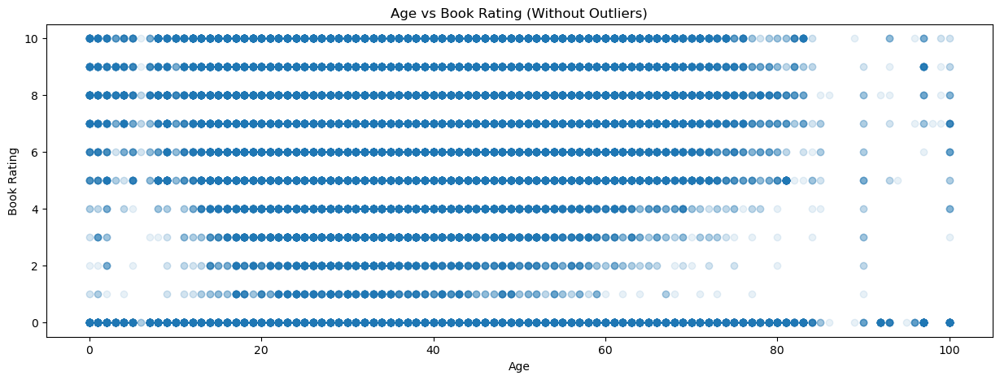

                         ISBN  Book-Title  Book-Author  Year-Of-Publication  \
ISBN                 1.000000    0.133265          NaN            -0.068255   
Book-Title           0.133265    1.000000          NaN             0.350035   
Book-Author               NaN         NaN          1.0                  NaN   
Year-Of-Publication -0.068255    0.350035          NaN             1.000000   
Publisher            1.000000         NaN          NaN             1.000000   
User-ID             -0.015529    0.006830         -1.0             0.001823   
Book-Rating          0.057114    0.153332         -1.0            -0.006739   
Location                  NaN         NaN          NaN                  NaN   
Age                 -0.073880   -0.210846          1.0             0.018101   
Locality            -0.150542         NaN          NaN             0.535482   
State                     NaN         NaN          NaN                  NaN   
Country                   NaN         NaN          N

In [19]:
#Scatter Plot

import matplotlib.pyplot as plt

# Calculate IQR for 'Age' and 'Book-Rating' columns
Q1_age = merged_df['Age'].quantile(0.10)
Q3_age = merged_df['Age'].quantile(0.90)
IQR_age = Q3_age - Q1_age

Q1_rating = merged_df['Book-Rating'].quantile(0.25)
Q3_rating = merged_df['Book-Rating'].quantile(0.75)
IQR_rating = Q3_rating - Q1_rating

# Define lower and upper bounds to filter out outliers
lower_bound_age = Q1_age - 1.5 * IQR_age
upper_bound_age = Q3_age + 1.5 * IQR_age

lower_bound_rating = Q1_rating - 1.5 * IQR_rating
upper_bound_rating = Q3_rating + 1.5 * IQR_rating

# Filter out rows where 'Age' and 'Book-Rating' are within the bounds
filtered_df = merged_df[(merged_df['Age'] >= lower_bound_age) & (merged_df['Age'] <= upper_bound_age) &
                        (merged_df['Book-Rating'] >= lower_bound_rating) & (merged_df['Book-Rating'] <= upper_bound_rating)]


# Set figure size (width, height) in inches
plt.figure(figsize=(15, 5))  # Adjust width and height according to your preference

# Scatter plot for 'Age' vs 'Book-Rating' without outliers
plt.scatter(filtered_df['Age'], filtered_df['Book-Rating'], alpha=0.1)
plt.title('Age vs Book Rating (Without Outliers)')
plt.xlabel('Age')
plt.ylabel('Book Rating')
plt.show()

filtered_df_numeric = filtered_df.apply(pd.to_numeric, errors='coerce')

# Correlation matrix for numeric columns after removing outliers
correlation_matrix = filtered_df_numeric.corr()
print(correlation_matrix)


<span style="font-family: 'Times New Roman'; font-size: 20px">2.5 Heat Map</span>

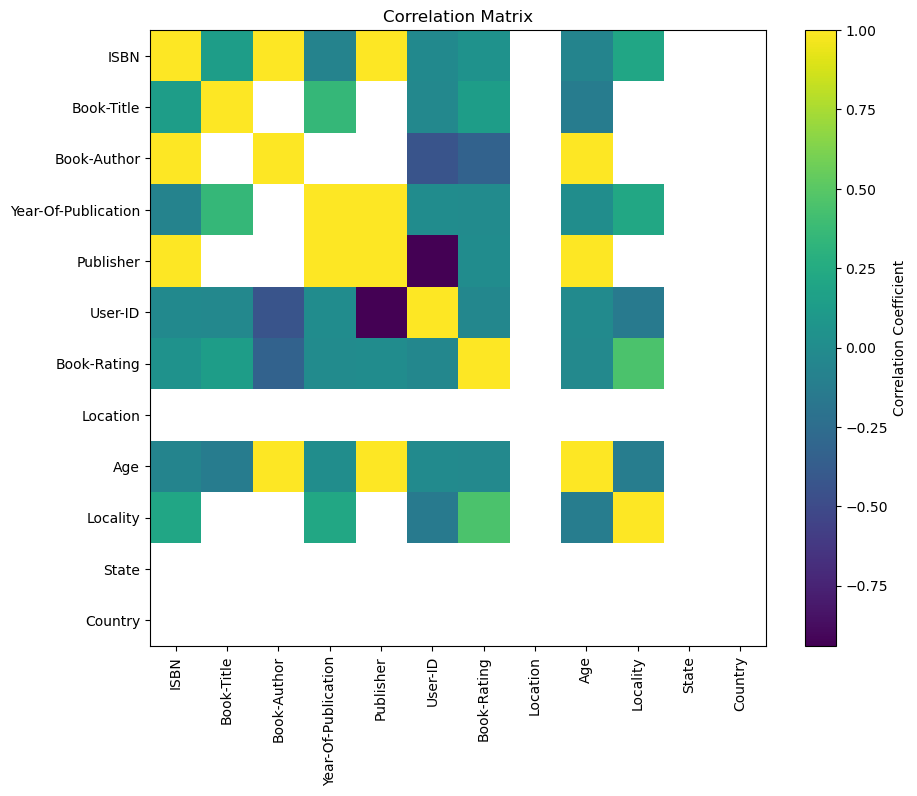

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_df = merged_df.apply(pd.to_numeric, errors='coerce')

# Calculate correlation matrix for numeric columns
correlation_matrix = numeric_df.corr()

# Create a heatmap for the correlation matrix
plt.figure(figsize=(10, 8))
plt.imshow(correlation_matrix, cmap='viridis', interpolation='nearest')
plt.colorbar(label='Correlation Coefficient')
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title('Correlation Matrix')
plt.show()

## BIVARIATE CATEGORICAL-NUMERIC VARIAVBLES

<span style="font-family: 'Times New Roman'; font-size: 20px">2.6.1 Box Plot: Location(Without Slpit) Vs Book Rating</span>

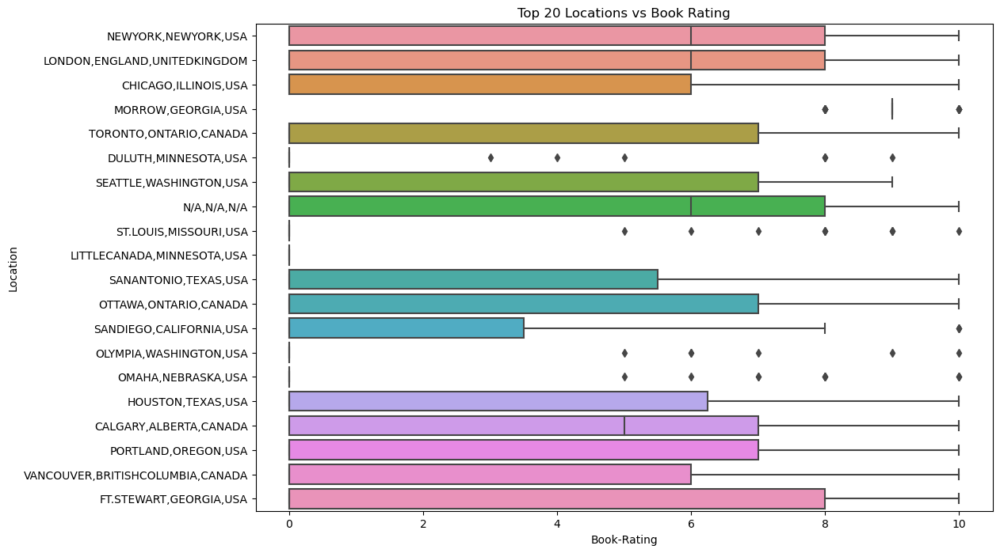

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 locations based on value counts
top_locations = merged_df['Location'].value_counts().head(20).index

# Filter the DataFrame for the top 20 locations
filtered_df = merged_df[merged_df['Location'].isin(top_locations)]

# Create a horizontal boxplot for the top 20 locations
plt.figure(figsize=(12, 8))
sns.boxplot(x='Book-Rating', y='Location', data=filtered_df.sample(1000), orient='h')
plt.title('Top 20 Locations vs Book Rating')
plt.xticks(rotation=0)  # Optional: Rotate x-axis labels if needed
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.6.2.a Box Plot: Location(without slpit) Vs Age</span>

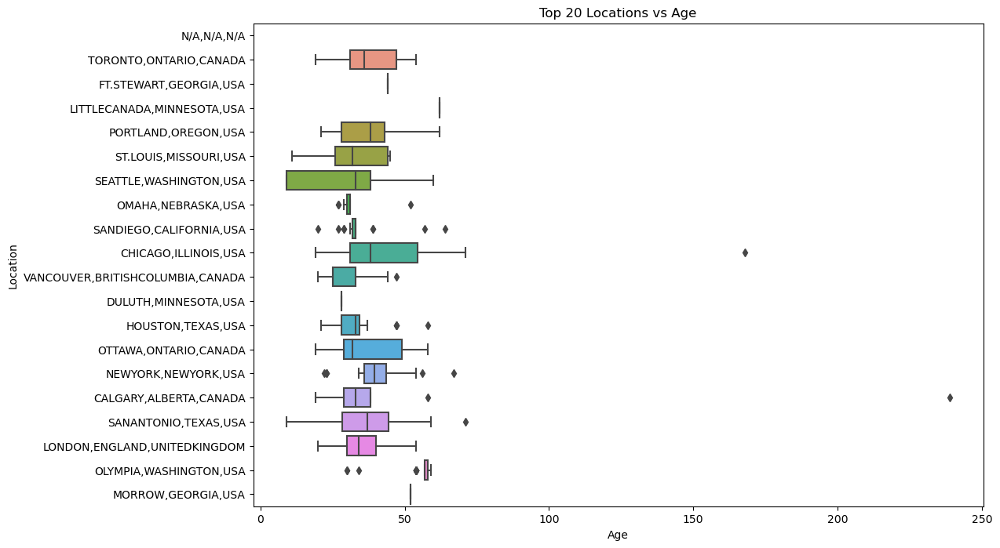

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 locations based on value counts
top_locations = merged_df['Location'].value_counts().head(20).index

# Filter the DataFrame for the top 20 locations
filtered_df = merged_df[merged_df['Location'].isin(top_locations)]

# Create a horizontal boxplot for the top 20 locations
plt.figure(figsize=(12, 8))
sns.boxplot(x='Age', y='Location', data=filtered_df.sample(1000), orient='h')
plt.title('Top 20 Locations vs Age')
plt.xticks(rotation=0)  # Optional: Rotate x-axis labels if needed
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.6.3.a Box Plot: locations(Without Split) Vs Age(without Outliers)</span>

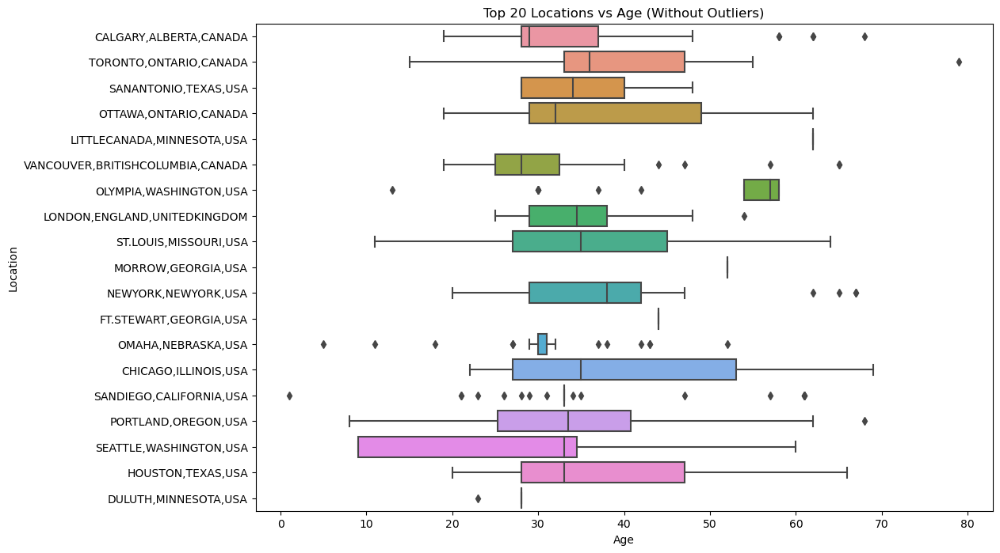

In [23]:
### without outliers

import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 locations based on value counts
top_locations = merged_df['Location'].value_counts().head(20).index

# Filter the DataFrame for the top 20 locations
filtered_df = merged_df[merged_df['Location'].isin(top_locations)]

# Calculate IQR for 'Age'
Q1_age = filtered_df['Age'].quantile(0.10)
Q3_age = filtered_df['Age'].quantile(0.90)
IQR_age = Q3_age - Q1_age

# Define lower and upper bounds to filter out outliers
lower_bound_age = Q1_age - 1.5 * IQR_age
upper_bound_age = Q3_age + 1.5 * IQR_age

# Filter out rows where 'Age' is within the bounds
filtered_df = filtered_df[(filtered_df['Age'] >= lower_bound_age) & (filtered_df['Age'] <= upper_bound_age)]

# Create a horizontal boxplot for the top 20 locations without outliers
plt.figure(figsize=(12, 8))
sns.boxplot(x='Age', y='Location', data=filtered_df.sample(1000), orient='h')
plt.title('Top 20 Locations vs Age (Without Outliers)')
plt.xticks(rotation=0)  # Optional: Rotate x-axis labels if needed
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 35px">2.7 Age</span>

In [24]:
# Replace NaN values in 'Age' column with a specific integer (-1 in this case)
merged_df['Age'].fillna(-1, inplace=True)

# Convert 'Age' column from float to integer
merged_df['Age'] = merged_df['Age'].astype(int)

# Print the first few rows of the DataFrame to verify the conversion
print(merged_df.head())

         ISBN                                         Book-Title  \
0  0195153448                                Classical Mythology   
1  0002005018                                       Clara Callan   
2  0060973129                               Decision in Normandy   
3  0374157065  Flu: The Story of the Great Influenza Pandemic...   
4  0393045218                             The Mummies of Urumchi   

            Book-Author Year-Of-Publication                   Publisher  \
0    Mark P. O. Morford                2002     Oxford University Press   
1  Richard Bruce Wright                2001       HarperFlamingo Canada   
2          Carlo D'Este                1991             HarperPerennial   
3      Gina Bari Kolata                1999        Farrar Straus Giroux   
4       E. J. W. Barber                1999  W. W. Norton &amp; Company   

   User-ID  Book-Rating                 Location  Age  Locality       State  \
0        2            0  STOCKTON,CALIFORNIA,USA   18  STOCKT

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.2 Check datatype of Age column</span>

In [25]:
merged_df['Age'].dtype

dtype('int32')

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.3 Creating new Column Group </span>

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the age groups
age_bins = [0, 18, 25, 35, 45, 60, 100]
age_labels = ['<18', '18-24', '25-34', '35-44', '45-59', '60+']

# Create a new column 'AgeGroup' based on age bins
merged_df['AgeGroup'] = pd.cut(merged_df['Age'], bins=age_bins, labels=age_labels)

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.4 Check For missing value [AgeGroup]</span>

In [27]:
merged_df['AgeGroup'].isnull().any()

True

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.5 Unique value in [AgeGroup]</span>

In [28]:
merged_df['AgeGroup'].unique()

['<18', NaN, '45-59', '25-34', '35-44', '60+', '18-24']
Categories (6, object): ['<18' < '18-24' < '25-34' < '35-44' < '45-59' < '60+']

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.6 Group Bar Graph: For Top Publisher based on Agegroup </span>

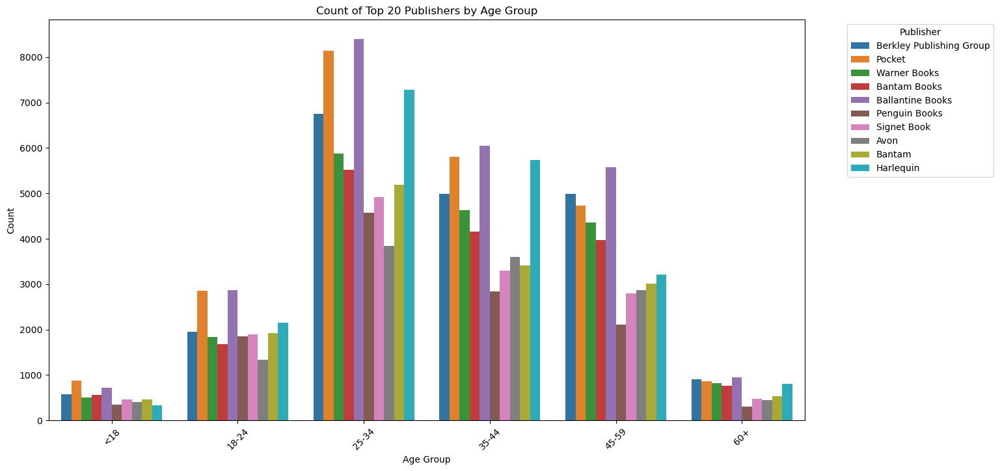

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 20 publishers based on value counts
top_publishers = merged_df['Publisher'].value_counts().head(10).index

# Filter the DataFrame for the top 20 publishers
filtered_df = merged_df[merged_df['Publisher'].isin(top_publishers)]

# Create a count plot for 'AgeGroup' vs count of 'Publisher' for the top 20 publishers
plt.figure(figsize=(15, 8))
sns.countplot(x='AgeGroup', hue='Publisher', data=filtered_df, order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
plt.title('Count of Top 20 Publishers by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better visibility
plt.legend(title='Publisher', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.7.a Group Bar Graph: Top State based on Agegroup </span>

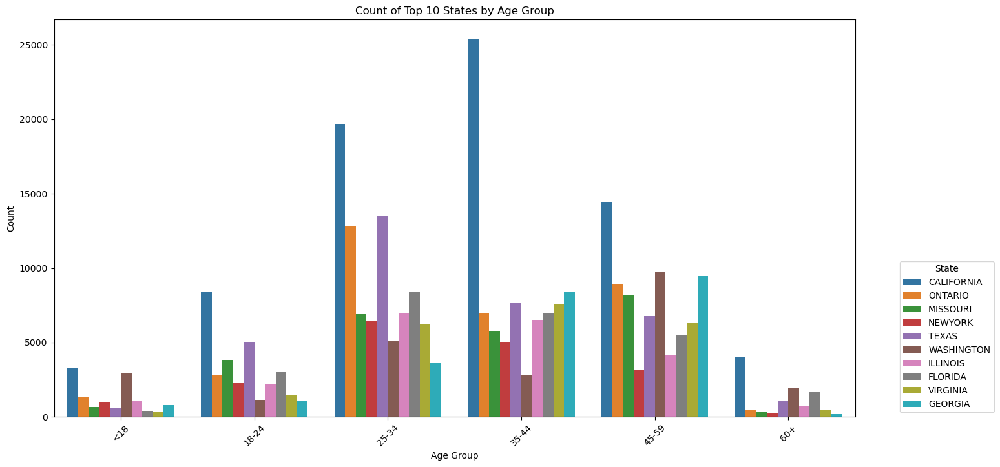

In [30]:
# Get the top 20 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

# Filter the DataFrame for the top 20 states
filtered_df_state = merged_df[merged_df['State'].isin(top_states)]

plt.figure(figsize=(16, 8))
sns.countplot(x='AgeGroup', hue='State', data=filtered_df_state, order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
plt.title('Count of Top 10 States by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='State', bbox_to_anchor=(1.05, 0), loc='lower left')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.7.b Group Bar Graph: Top State based on Agegroup </span>

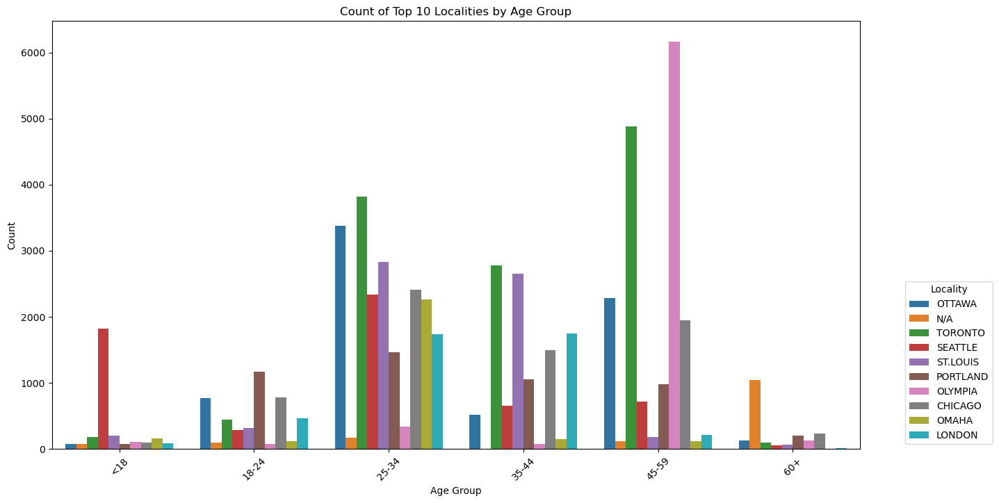

In [31]:
# Get the top 20 localities based on value counts
top_localities = merged_df['Locality'].value_counts().head(10).index

# Filter the DataFrame for the top 20 localities
filtered_df_locality = merged_df[merged_df['Locality'].isin(top_localities)]

plt.figure(figsize=(15, 8))
sns.countplot(x='AgeGroup', hue='Locality', data=filtered_df_locality, order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
plt.title('Count of Top 10 Localities by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Locality', bbox_to_anchor=(1.05, 0), loc='lower left')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.7.c Group Bar Graph: Top Countries based on Agegroup </span>

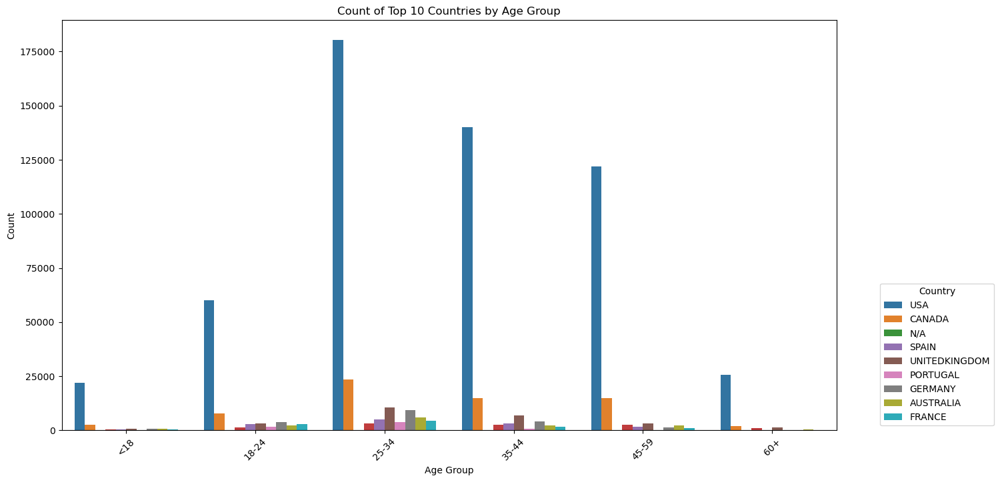

In [32]:
# Get the top 20 countries based on value counts
top_countries = merged_df['Country'].value_counts().head(10).index

# Filter the DataFrame for the top 20 countries
filtered_df_country = merged_df[merged_df['Country'].isin(top_countries)]

plt.figure(figsize=(15, 8))
sns.countplot(x='AgeGroup', hue='Country', data=filtered_df_country, order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
plt.title('Count of Top 10 Countries by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Country', bbox_to_anchor=(1.05, 0), loc='lower left')
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.8 Group Bar Graph: Top Book title based on Agegroup </span>

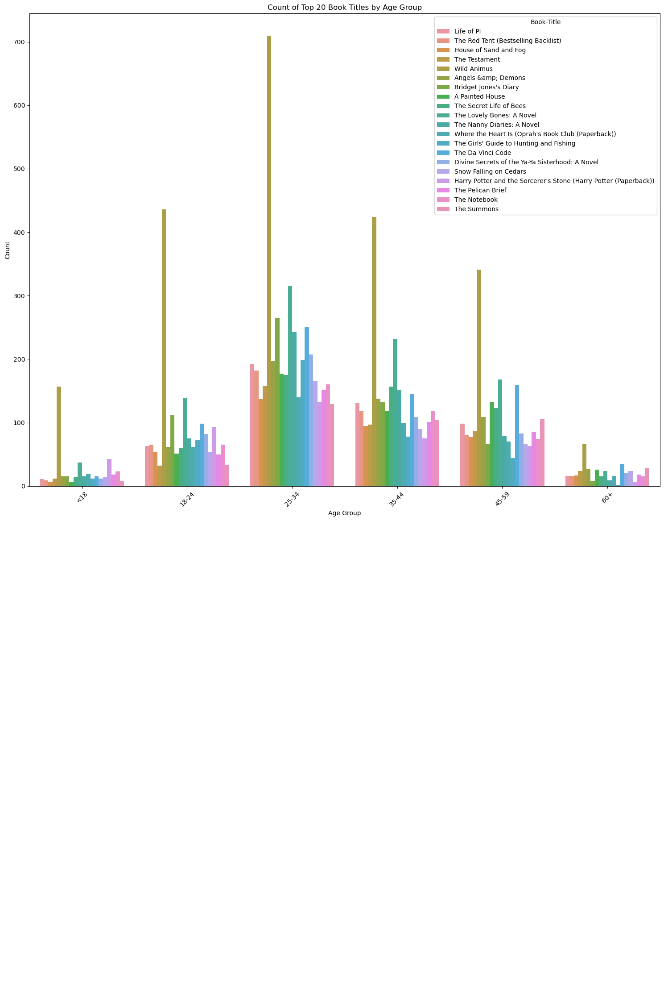

In [33]:
# Create a count plot for 'AgeGroup' vs count of 'Book-Title' for the top 20 titles
# Get the top 20 book titles based on value counts
top_titles = merged_df['Book-Title'].value_counts().head(20).index

filtered_df_title = merged_df[merged_df['Book-Title'].isin(top_titles)]

plt.figure(figsize=(15, 15))  # Set the figure size to accommodate both the plot and legend
ax1 = plt.subplot(2, 1, 1)  # Create the first subplot (plot)
sns.countplot(x='AgeGroup', hue='Book-Title', data=filtered_df_title, 
              order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
plt.title('Count of Top 20 Book Titles by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)

ax2 = plt.subplot(2, 1, 2)  # Create the second subplot (legend)
ax2.axis('off')  # Turn off the axis for the legend subplot
# ax2.legend(title='Book Title', bbox_to_anchor=(0, 0), loc='upper left', ncol=2)  # Adjust position and number of columns in legend

plt.tight_layout(rect=[0, 0, 1, 1.5])  # Adjust spacing between subplots and set the rect parameter to avoid overlap
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 35px">2.7.8.1 Year Of Publication </span>

In [34]:
merged_df['Year-Of-Publication'] = pd.to_numeric(merged_df['Year-Of-Publication'], errors='coerce')
merged_df['Year-Of-Publication'].dtype

dtype('float64')

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.8.2 Change [Year-Of-Publication] to int </span>

In [35]:
merged_df['Year-Of-Publication'] = merged_df['Year-Of-Publication'].fillna(0).astype(int)


merged_df.dropna(subset=['Year-Of-Publication'], inplace=True)

merged_df['Year-Of-Publication'] = merged_df['Year-Of-Publication'].astype(int)

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.8.3 Unique Values [Year-Of-Publication]</span>

In [36]:
merged_df['Year-Of-Publication'].unique

<bound method Series.unique of 0          2002
1          2001
2          1991
3          1999
4          1999
           ... 
1031131    1966
1031132    2001
1031133    1981
1031134    1998
1031135    2003
Name: Year-Of-Publication, Length: 1031136, dtype: int32>

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.8.4 Bar Chart:Age Vs YOP </span>

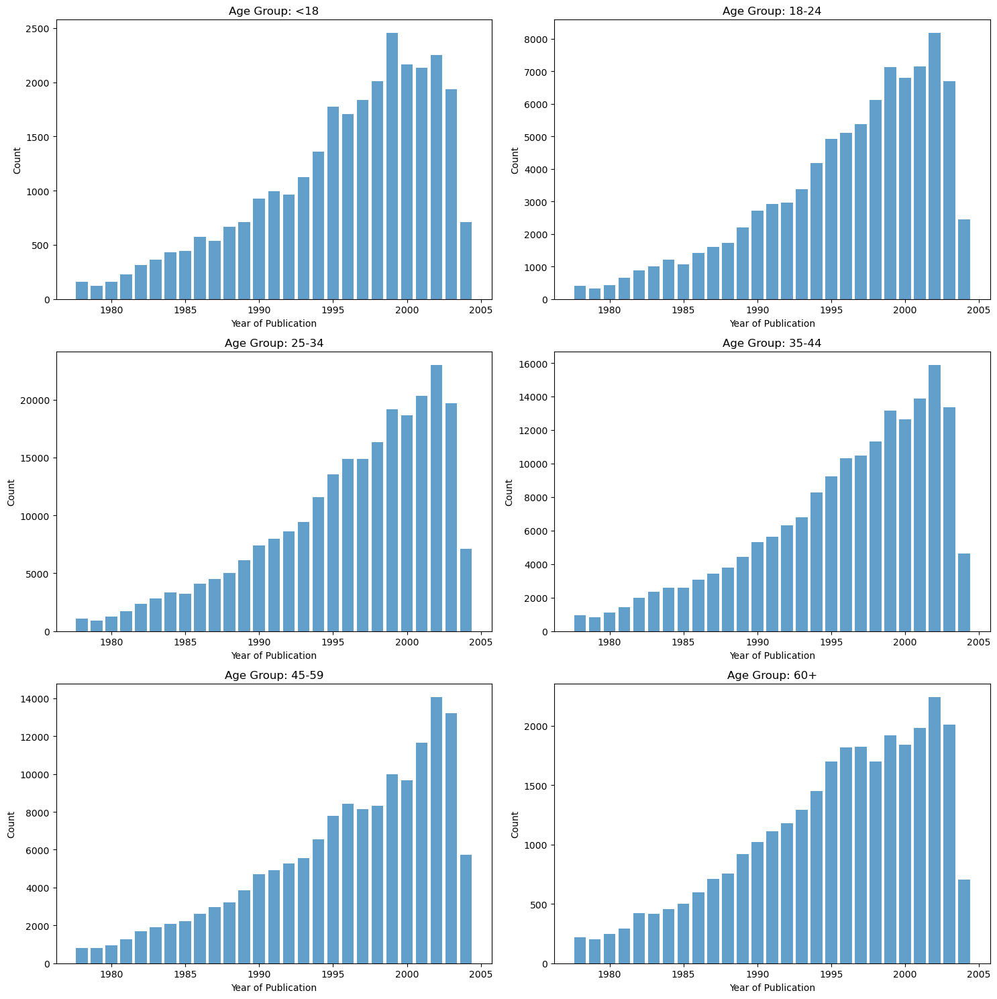

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'Year-Of-Publication' column is of numeric data type
merged_df['Year-Of-Publication'] = pd.to_numeric(merged_df['Year-Of-Publication'], errors='coerce')

# Ensure 'AgeGroup' column is of string data type
merged_df['AgeGroup'] = merged_df['AgeGroup'].astype(str)

# Mapping for AgeGroup to numerical values
age_group_mapping = {
    '<18': 1,
    '18-24': 2,
    '25-34': 3,
    '35-44': 4,
    '45-59': 5,
    '60+': 6
}

# Function to map age group labels to numeric values
def map_age_group(age_group):
    return age_group_mapping.get(age_group, 0)  # Returns 0 for unknown values

# Apply mapping function to create a new numerical column 'AgeGroupNumeric'
merged_df['AgeGroupNumeric'] = merged_df['AgeGroup'].apply(map_age_group)

# Define the lower and upper bounds for 'Year-Of-Publication' to remove outliers
lower_bound = merged_df['Year-Of-Publication'].quantile(0.04)
upper_bound = merged_df['Year-Of-Publication'].quantile(0.99)

# Filter the DataFrame to remove outliers in 'Year-Of-Publication'
filtered_df = merged_df[(merged_df['Year-Of-Publication'] >= lower_bound) & 
                        (merged_df['Year-Of-Publication'] <= upper_bound)]

# Create separate bar plots for the count of 'Year-Of-Publication' for each age group
plt.figure(figsize=(15, 15))

for age_group, group_num in age_group_mapping.items():
    plt.subplot(3, 2, group_num)
    age_group_data = filtered_df[filtered_df['AgeGroup'] == age_group]
    year_counts = age_group_data['Year-Of-Publication'].value_counts().sort_index()
    plt.bar(year_counts.index, year_counts.values, alpha=0.7)
    plt.title(f'Age Group: {age_group}')
    plt.xlabel('Year of Publication')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [38]:
upper_bound, lower_bound

(2004.0, 1978.0)

In [39]:
#We have publications Between 2004 and 1978 

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.9.a Bar charts: Top Books according to Age Group  </span>

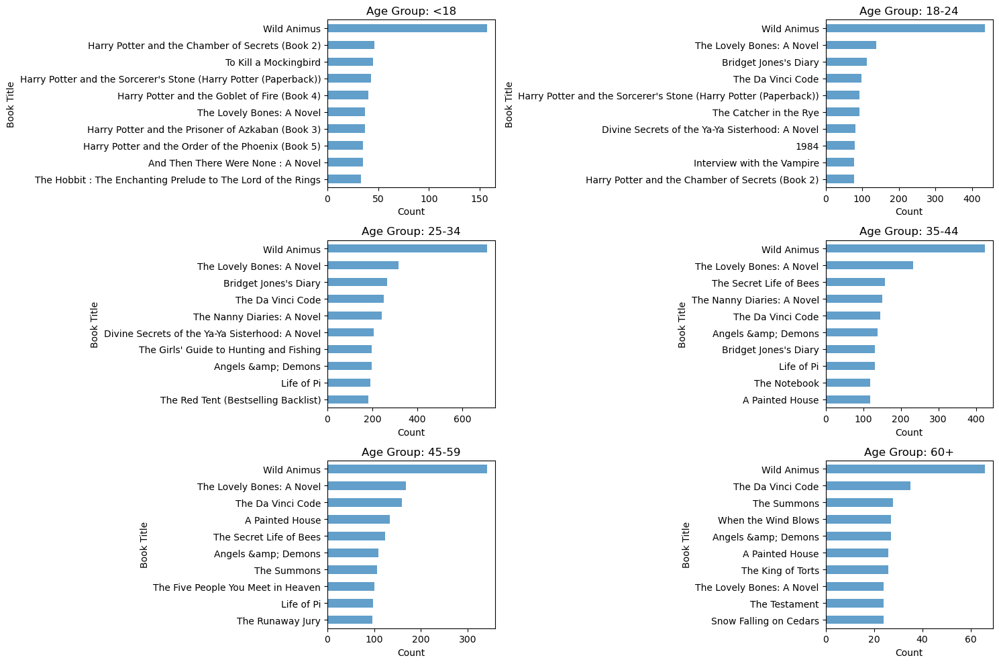

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'AgeGroup' column is of string data type
merged_df['AgeGroup'] = merged_df['AgeGroup'].astype(str)

# Mapping for AgeGroup to numerical values
age_group_mapping = {
    '<18': 1,
    '18-24': 2,
    '25-34': 3,
    '35-44': 4,
    '45-59': 5,
    '60+': 6
}

# Function to map age group labels to numeric values
def map_age_group(age_group):
    return age_group_mapping.get(age_group, 0)  # Returns 0 for unknown values

# Apply mapping function to create a new numerical column 'AgeGroupNumeric'
merged_df['AgeGroupNumeric'] = merged_df['AgeGroup'].apply(map_age_group)

# Create separate bar plots for the count of 'Book-Title' for each age group
plt.figure(figsize=(15, 10))

for age_group, group_num in age_group_mapping.items():
    plt.subplot(3, 2, group_num)
    age_group_data = merged_df[merged_df['AgeGroup'] == age_group]
    book_title_counts = age_group_data['Book-Title'].value_counts().head(10)  # Top 10 Book Titles for each age group
    book_title_counts[::-1].plot(kind='barh', alpha=0.7)  # Use barh for horizontal bar plot
    plt.title(f'Age Group: {age_group}')
    plt.xlabel('Count')
    plt.ylabel('Book Title')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.9.b Bar charts: Top Books author viewed according to Age Group  </span>

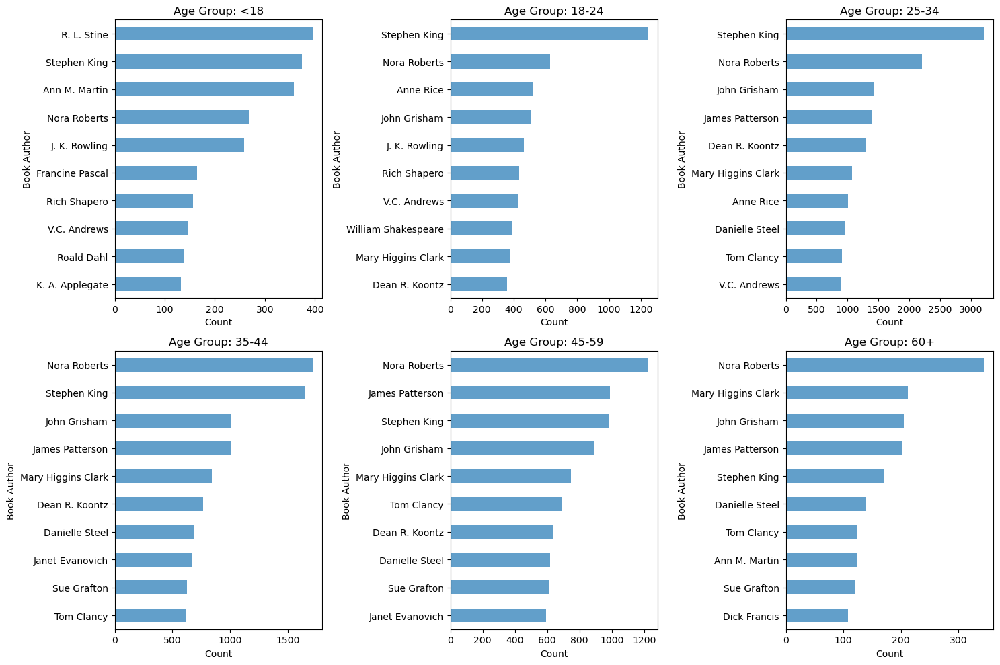

In [41]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'AgeGroup' column is of string data type
merged_df['AgeGroup'] = merged_df['AgeGroup'].astype(str)

# Mapping for AgeGroup to numerical values
age_group_mapping = {
    '<18': 1,
    '18-24': 2,
    '25-34': 3,
    '35-44': 4,
    '45-59': 5,
    '60+': 6
}

# Function to map age group labels to numeric values
def map_age_group(age_group):
    return age_group_mapping.get(age_group, 0)  # Returns 0 for unknown values

# Apply mapping function to create a new numerical column 'AgeGroupNumeric'
merged_df['AgeGroupNumeric'] = merged_df['AgeGroup'].apply(map_age_group)

# Create separate bar plots for the count of 'Book-Author' for each age group
plt.figure(figsize=(15, 10))

for age_group, group_num in age_group_mapping.items():
    plt.subplot(2, 3, group_num)
    age_group_data = merged_df[merged_df['AgeGroup'] == age_group]
    book_author_counts = age_group_data['Book-Author'].value_counts().head(10)  # Top 10 Book Authors for each age group
    book_author_counts[::-1].plot(kind='barh', alpha=0.7)  # Use barh for horizontal bar plot
    plt.title(f'Age Group: {age_group}')
    plt.xlabel('Count')
    plt.ylabel('Book Author')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.9.b Group Bar charts: Top Publishers viewed in States according to Age Group   </span>

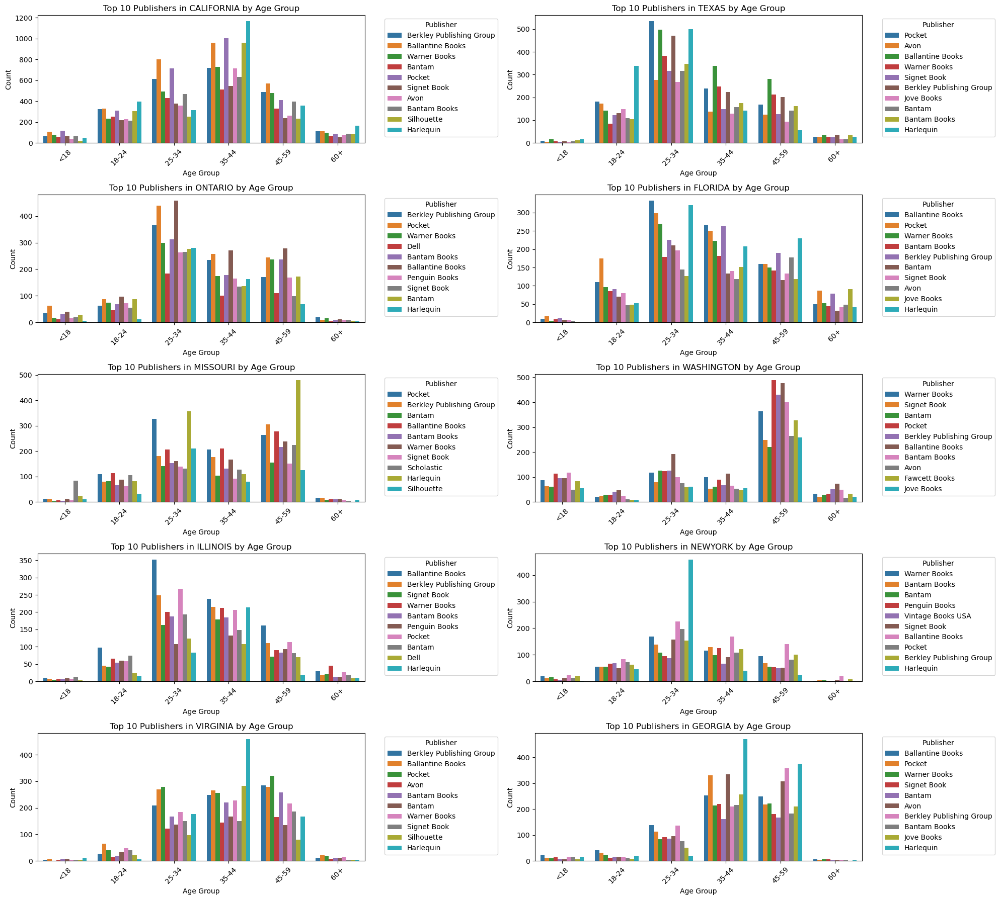

In [42]:
# State Wise Top 10 Publishers

# Get the top 10 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 states
for i, state in enumerate(top_states, 1):
    # Filter the DataFrame for the current state
    filtered_df_state = merged_df[merged_df['State'] == state]
    
    # Get the top 10 publishers for the current state
    top_publishers_state = filtered_df_state['Publisher'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 publishers in the current state
    filtered_df_publishers = filtered_df_state[filtered_df_state['Publisher'].isin(top_publishers_state)]
    
      # Set the figure size to accommodate both the plot and legend
    
    # Create a count plot for 'AgeGroup' vs count of 'Publisher' for the current state
    plt.subplot(5, 2, i)  # Create a subplot for each state
    
    
    sns.countplot(x='AgeGroup', hue='Publisher', data=filtered_df_publishers, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Publishers in {state} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Publisher', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.9.c Bar charts: Top Publisher viewed in localities according to Age Group  </span>

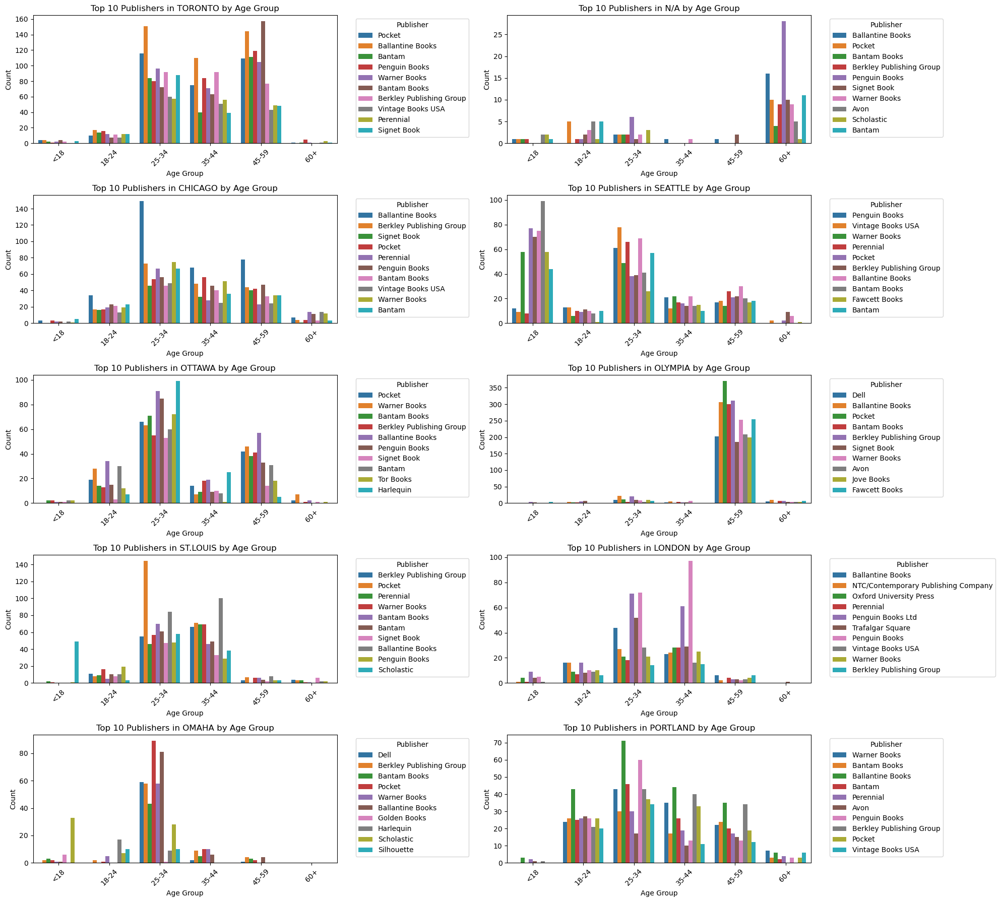

In [43]:
# Locality Wise Top 10 Publishers

# Get the top 10 localities based on value counts
top_localities = merged_df['Locality'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 localities
for i, locality in enumerate(top_localities, 1):
    # Filter the DataFrame for the current locality
    filtered_df_locality = merged_df[merged_df['Locality'] == locality]
    
    # Get the top 10 publishers for the current locality
    top_publishers_locality = filtered_df_locality['Publisher'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 publishers in the current locality
    filtered_df_publishers = filtered_df_locality[filtered_df_locality['Publisher'].isin(top_publishers_locality)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Publisher' for the current locality
    plt.subplot(5, 2, i)  # Create a subplot for each locality
    sns.countplot(x='AgeGroup', hue='Publisher', data=filtered_df_publishers, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Publishers in {locality} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Publisher', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.9.d Bar charts: Top Publisher viewed in COuntries according to Age Group  </span>

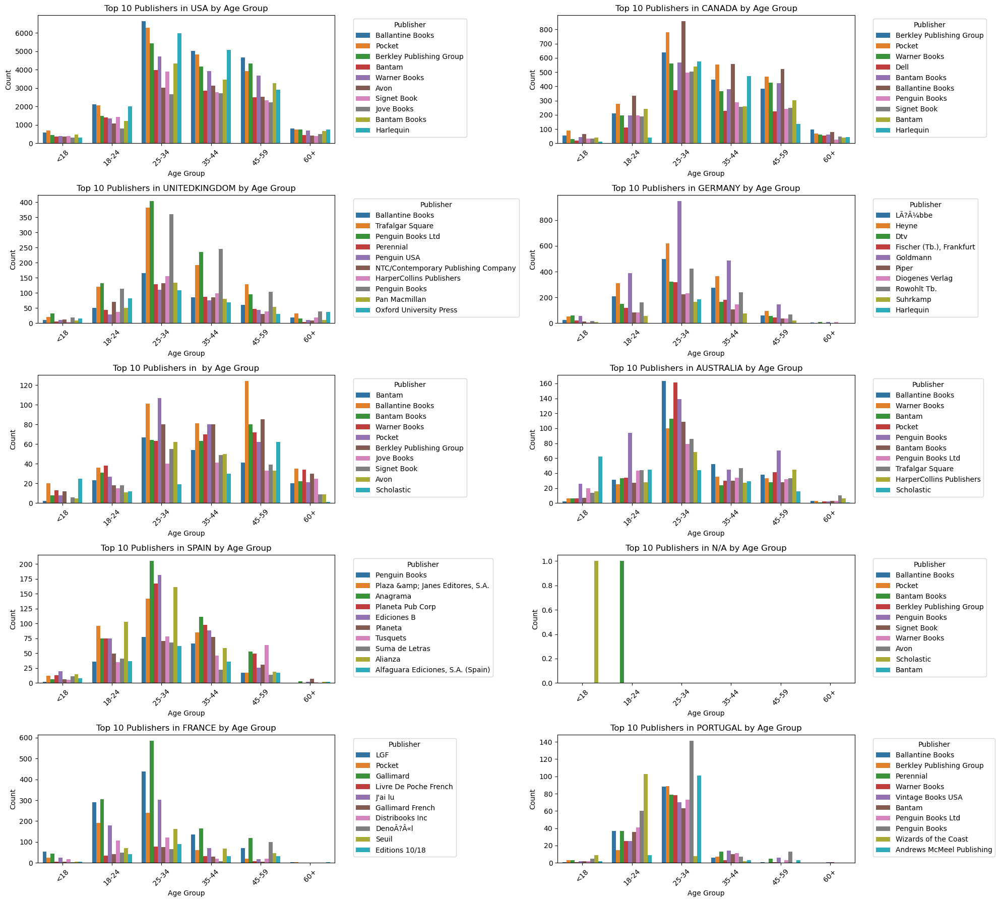

In [44]:
# Country Wise Top 10 Publishers

# Get the top 10 countries based on value counts
top_countries = merged_df['Country'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 countries
for i, country in enumerate(top_countries, 1):
    # Filter the DataFrame for the current country
    filtered_df_country = merged_df[merged_df['Country'] == country]
    
    # Get the top 10 publishers for the current country
    top_publishers_country = filtered_df_country['Publisher'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 publishers in the current country
    filtered_df_publishers = filtered_df_country[filtered_df_country['Publisher'].isin(top_publishers_country)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Publisher' for the current country
    plt.subplot(5, 2, i)  # Create a subplot for each country
    sns.countplot(x='AgeGroup', hue='Publisher', data=filtered_df_publishers, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Publishers in {country} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Publisher', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
# State Wise Top 10 Publishersplt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.a Bar charts: Top Author viewed in State according to Age Group  </span>

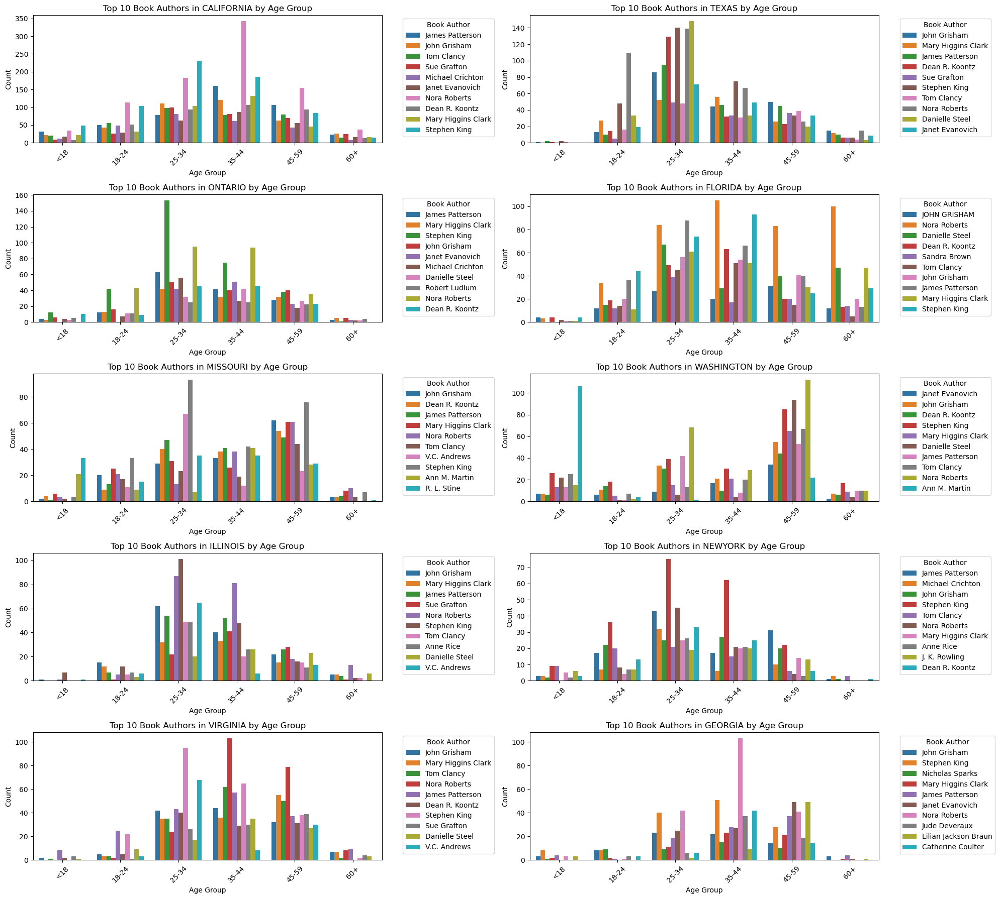

In [45]:
# State Wise Top 10 Authors

# Get the top 10 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 states
for i, state in enumerate(top_states, 1):
    # Filter the DataFrame for the current state
    filtered_df_state = merged_df[merged_df['State'] == state]
    
    # Get the top 10 book authors for the current state
    top_authors_state = filtered_df_state['Book-Author'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 book authors in the current state
    filtered_df_authors = filtered_df_state[filtered_df_state['Book-Author'].isin(top_authors_state)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Book-Author' for the current state
    plt.subplot(5, 2, i)  # Create a subplot for each state
    sns.countplot(x='AgeGroup', hue='Book-Author', data=filtered_df_authors, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Book Authors in {state} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Book Author', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.b Bar charts: Top Author viewed in localities according to Age Group  </span>

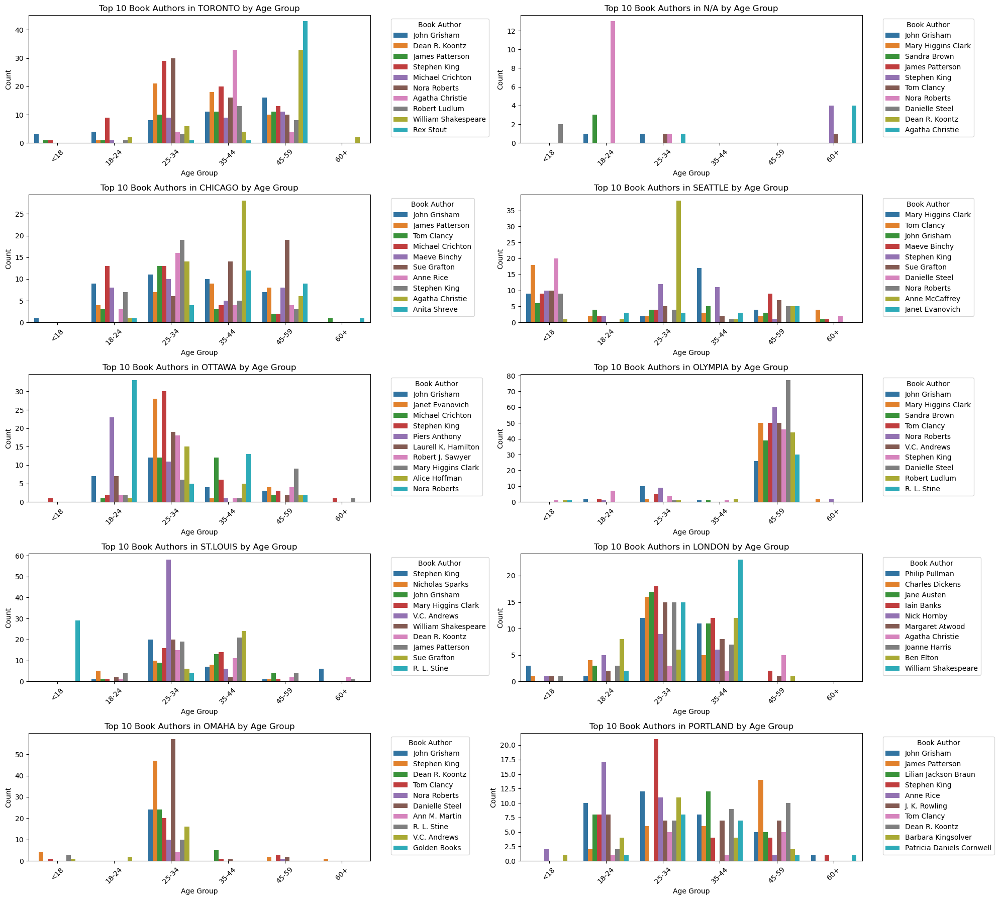

In [46]:
# Locality Wise Top 10 Authors

# Get the top 10 localities based on value counts
top_localities = merged_df['Locality'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 localities
for i, locality in enumerate(top_localities, 1):
    # Filter the DataFrame for the current locality
    filtered_df_locality = merged_df[merged_df['Locality'] == locality]
    
    # Get the top 10 book authors for the current locality
    top_authors_locality = filtered_df_locality['Book-Author'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 book authors in the current locality
    filtered_df_authors = filtered_df_locality[filtered_df_locality['Book-Author'].isin(top_authors_locality)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Book-Author' for the current locality
    plt.subplot(5, 2, i)  # Create a subplot for each locality
    sns.countplot(x='AgeGroup', hue='Book-Author', data=filtered_df_authors, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Book Authors in {locality} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Book Author', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.c Bar charts: Top Author viewed in Countires according to Age Group  </span>

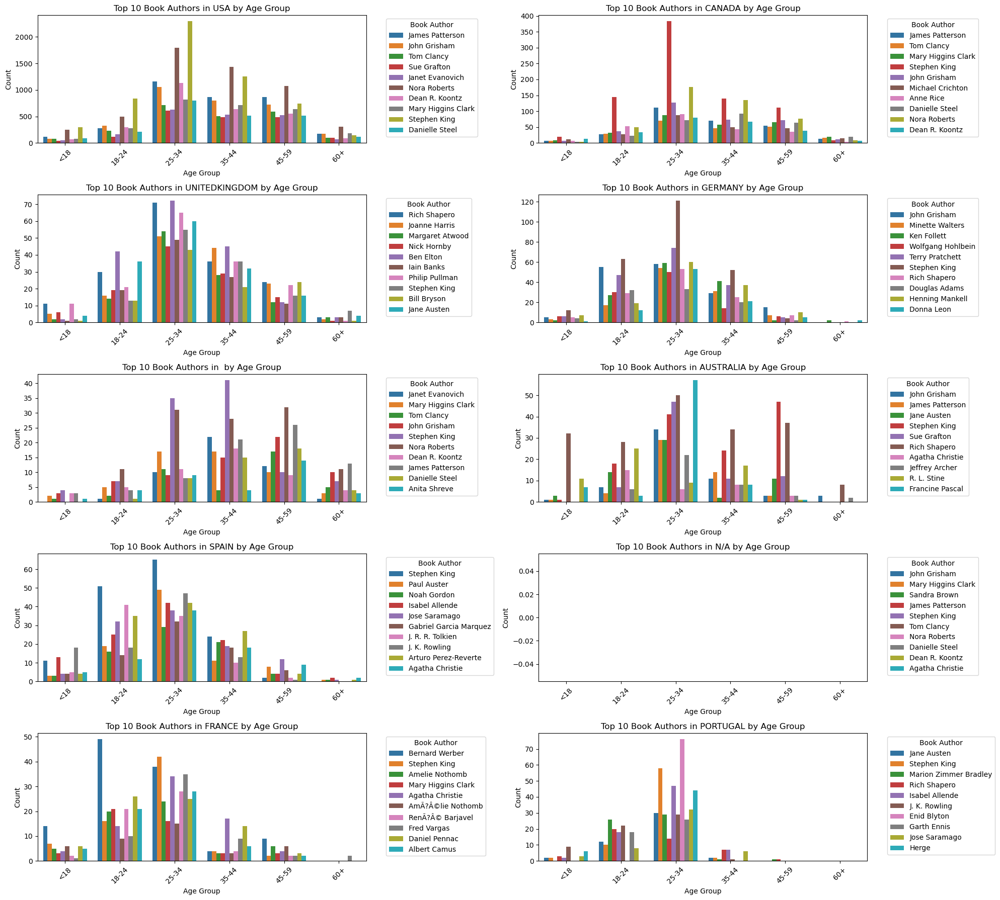

In [47]:
# Country Wise Top 10 Authors

# Get the top 10 countries based on value counts
top_countries = merged_df['Country'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 countries
for i, country in enumerate(top_countries, 1):
    # Filter the DataFrame for the current country
    filtered_df_country = merged_df[merged_df['Country'] == country]
    
    # Get the top 10 book authors for the current country
    top_authors_country = filtered_df_country['Book-Author'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 book authors in the current country
    filtered_df_authors = filtered_df_country[filtered_df_country['Book-Author'].isin(top_authors_country)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Book-Author' for the current country
    plt.subplot(5, 2, i)  # Create a subplot for each country
    sns.countplot(x='AgeGroup', hue='Book-Author', data=filtered_df_authors, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'])
    plt.title(f'Top 10 Book Authors in {country} by Age Group')
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Book Author', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.a Bar charts: Count of users VS YOP according to localities  </span>
    

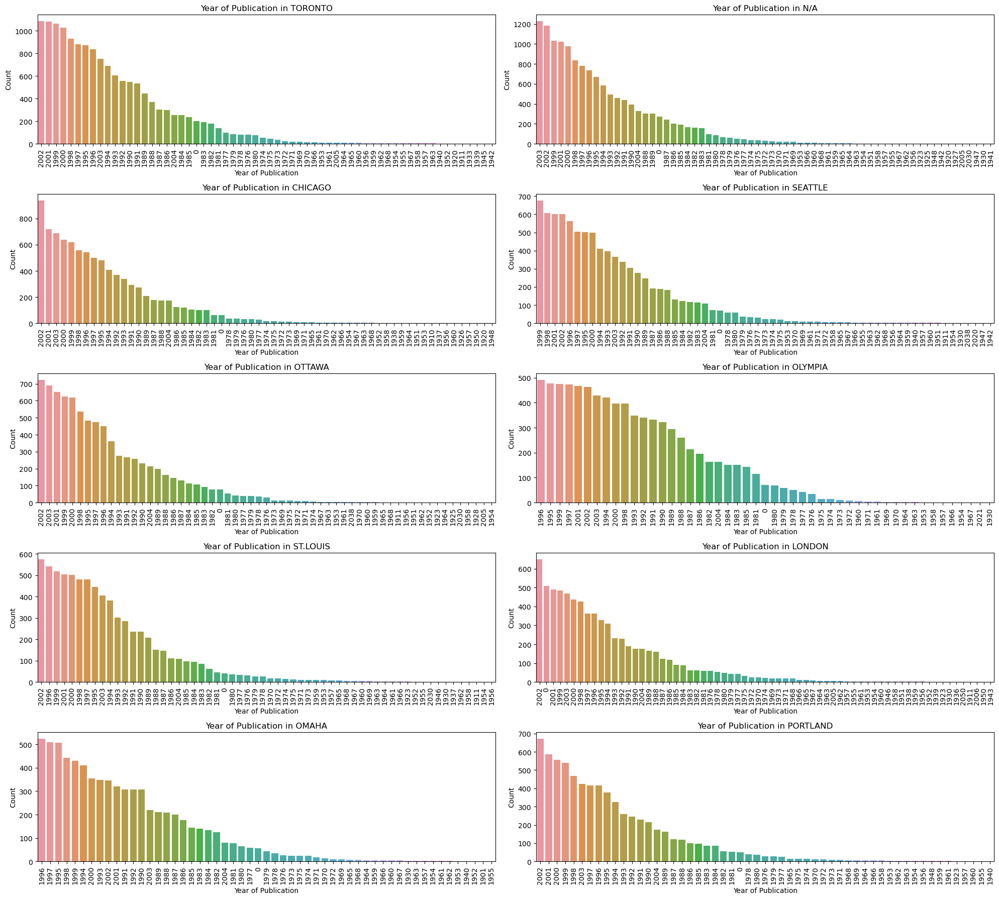

In [48]:
# Get the top 10 localities based on value counts
top_localities = merged_df['Locality'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 localities
for i, locality in enumerate(top_localities, 1):
    # Filter the DataFrame for the current locality
    filtered_df_locality = merged_df[merged_df['Locality'] == locality]
    
    # Create a count plot for 'Year-Of-Publication' for the current locality
    plt.subplot(5, 2, i)  # Create a subplot for each locality
    sns.countplot(x='Year-Of-Publication', data=filtered_df_locality, 
                  order=filtered_df_locality['Year-Of-Publication'].value_counts().index)  # Order by count of publications
    plt.title(f'Year of Publication in {locality}')
    plt.xlabel('Year of Publication')
    plt.ylabel('Count')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.b Bar charts: Count of users VS YOP according to States  </span>
    

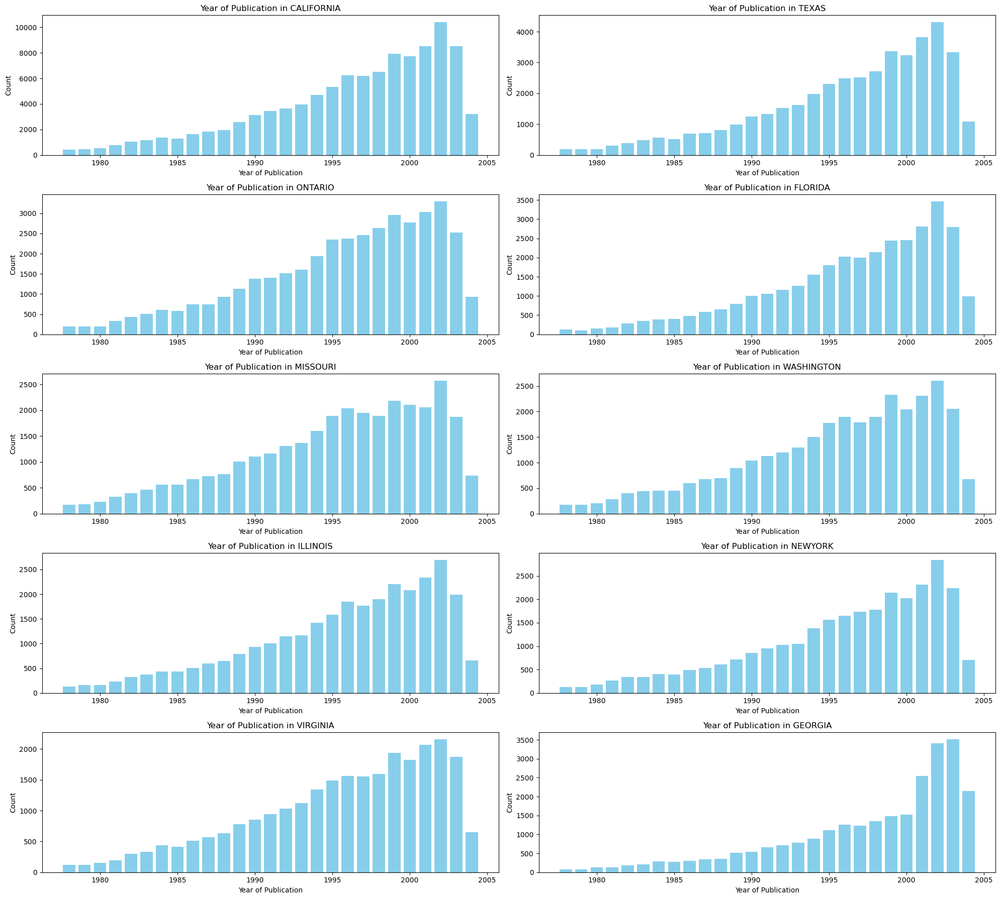

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Get the top 10 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 states
for i, state in enumerate(top_states, 1):
    # Filter the DataFrame for the current state and remove outliers in 'Year-Of-Publication'
    filtered_df_state = merged_df[(merged_df['State'] == state) & 
                                   (merged_df['Year-Of-Publication'] >= lower_bound) & 
                                   (merged_df['Year-Of-Publication'] <= upper_bound)]
    
    # Count the number of publications for each year
    year_counts = filtered_df_state['Year-Of-Publication'].value_counts().sort_index()
    
    # Create a bar plot with Year of Publication on X-axis and Count on Y-axis
    plt.subplot(5, 2, i)  # Create a subplot for each state
    plt.bar(year_counts.index, year_counts.values, color='skyblue')
    plt.title(f'Year of Publication in {state}')
    plt.xlabel('Year of Publication')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

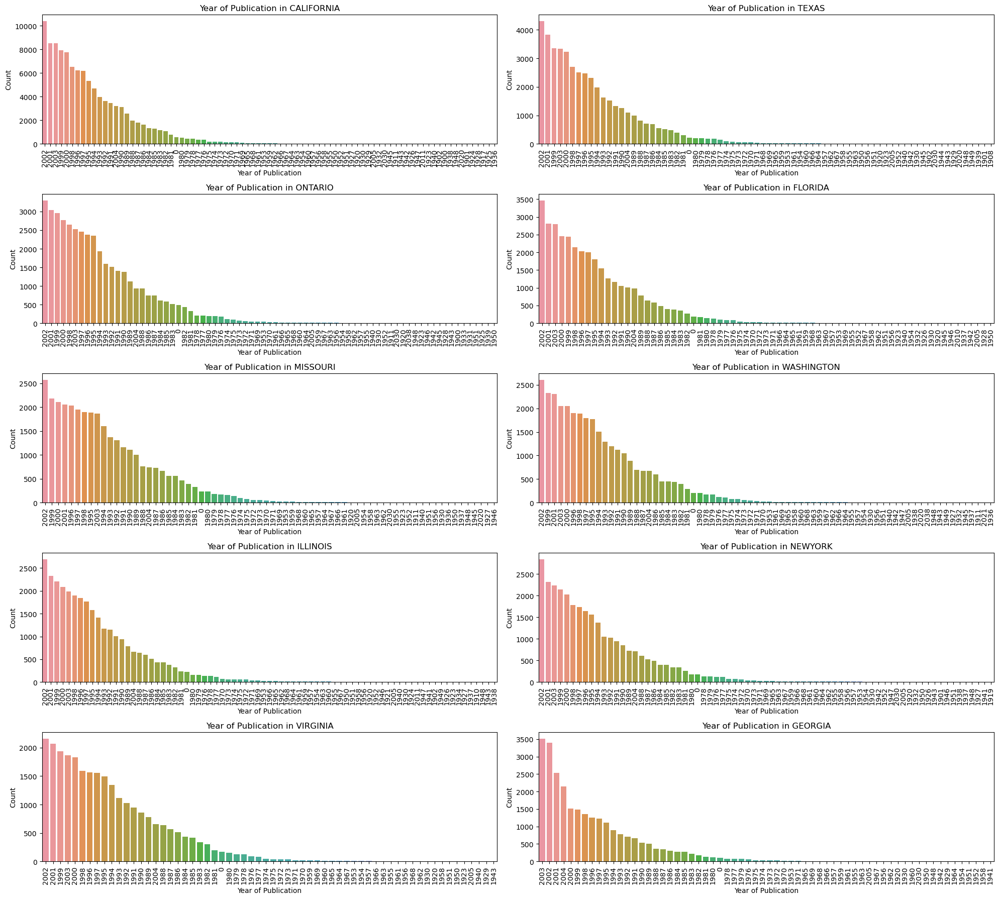

In [50]:
# Get the top 10 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 states
for i, state in enumerate(top_states, 1):
    # Filter the DataFrame for the current state
    filtered_df_state = merged_df[merged_df['State'] == state]
    
    # Create a count plot for 'Year-Of-Publication' for the current state
    plt.subplot(5, 2, i)  # Create a subplot for each state
    sns.countplot(x='Year-Of-Publication', data=filtered_df_state, 
                  order=filtered_df_state['Year-Of-Publication'].value_counts().index)  # Order by count of publications
    plt.title(f'Year of Publication in {state}')
    plt.xlabel('Year of Publication')
    plt.ylabel('Count')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">Copy </span>

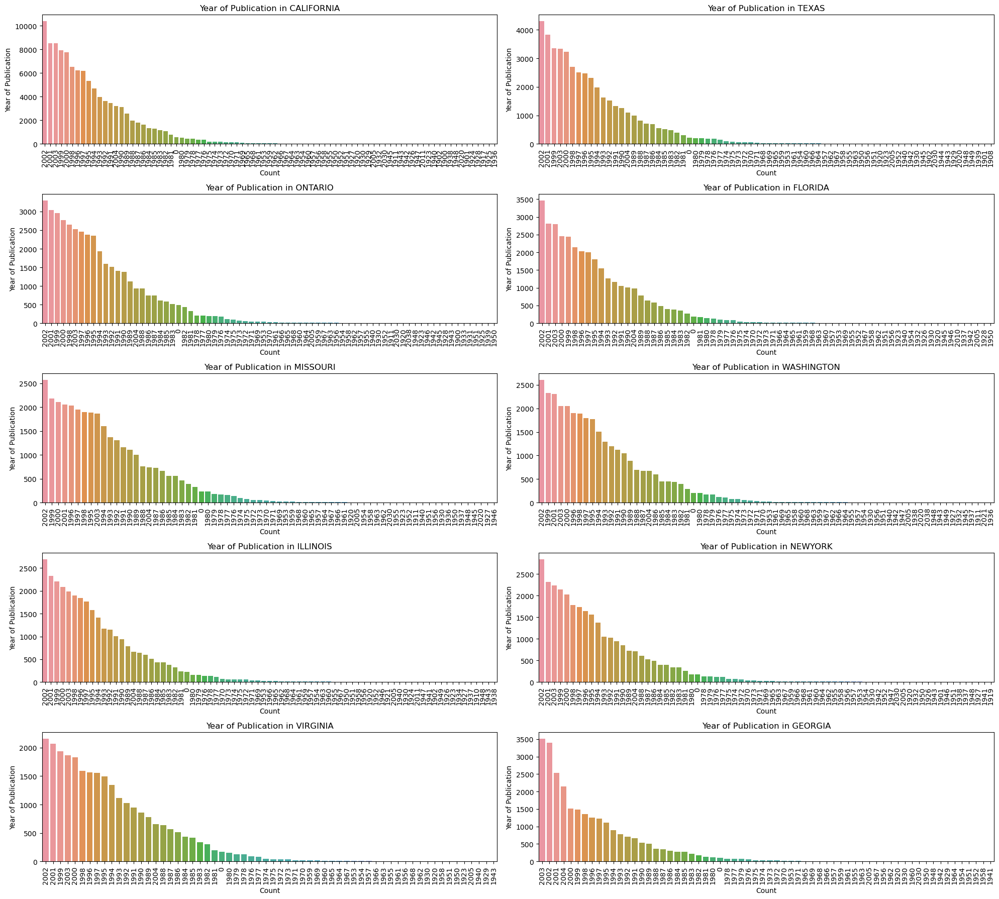

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 states based on value counts
top_states = merged_df['State'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 states
for i, state in enumerate(top_states, 1):
    # Filter the DataFrame for the current state
    filtered_df_state = merged_df[merged_df['State'] == state]
    
    # Create a count plot with count on X-axis and 'Year-Of-Publication' on Y-axis for the current state
    plt.subplot(5, 2, i)  # Create a subplot for each state
    sns.countplot(x='Year-Of-Publication', data=filtered_df_state, 
                  order=filtered_df_state['Year-Of-Publication'].value_counts().index)  # Order by count of publications
    plt.title(f'Year of Publication in {state}')
    plt.xlabel('Count')
    plt.ylabel('Year of Publication')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.10.c Bar charts: Count of users VS YOP according to Countries  </span>

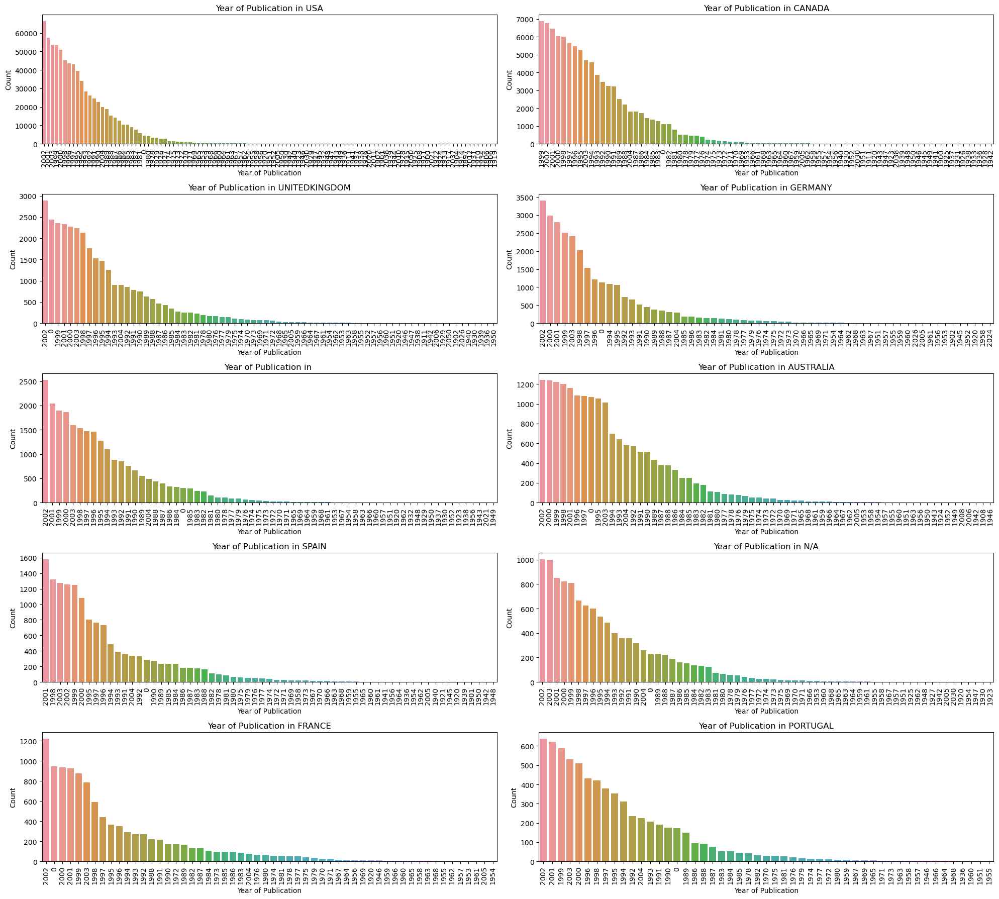

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 countries based on value counts
top_countries = merged_df['Country'].value_counts().head(10).index

plt.figure(figsize=(20, 18))

# Iterate through the top 10 countries
for i, country in enumerate(top_countries, 1):
    # Filter the DataFrame for the current country
    filtered_df_country = merged_df[merged_df['Country'] == country]
    
    # Create a count plot with count on X-axis and 'Year-Of-Publication' on Y-axis for the current country
    plt.subplot(5, 2, i)  # Create a subplot for each country
    sns.countplot(x='Year-Of-Publication', data=filtered_df_country, 
                  order=filtered_df_country['Year-Of-Publication'].value_counts().index)  # Order by count of publications
    plt.title(f'Year of Publication in {country}')
    plt.xlabel('Year of Publication')
    plt.ylabel('Count')
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.11.a charts: Users read Count VS YOP according to Book Author  </span>

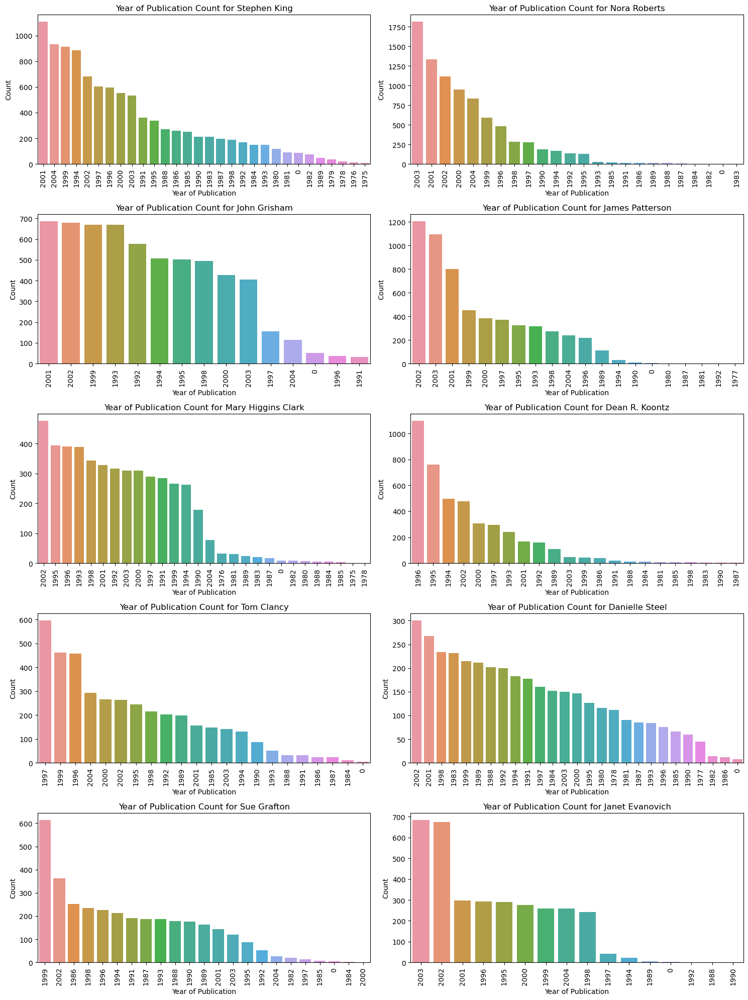

In [53]:

import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 authors based on value counts
top_authors = merged_df['Book-Author'].value_counts().head(10).index

# Create subplots for each author
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

# Iterate through the top authors and plot Year-Of-Publication count for each author
for i, author in enumerate(top_authors):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    # Filter the DataFrame for the current author
    filtered_df_author = merged_df[merged_df['Book-Author'] == author]
    
    # Plot 'Year-Of-Publication' count for the current author
    sns.countplot(x='Year-Of-Publication', data=filtered_df_author, ax=ax,
                  order=filtered_df_author['Year-Of-Publication'].value_counts().index)
    
    ax.set_title(f'Year of Publication Count for {author}')
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()


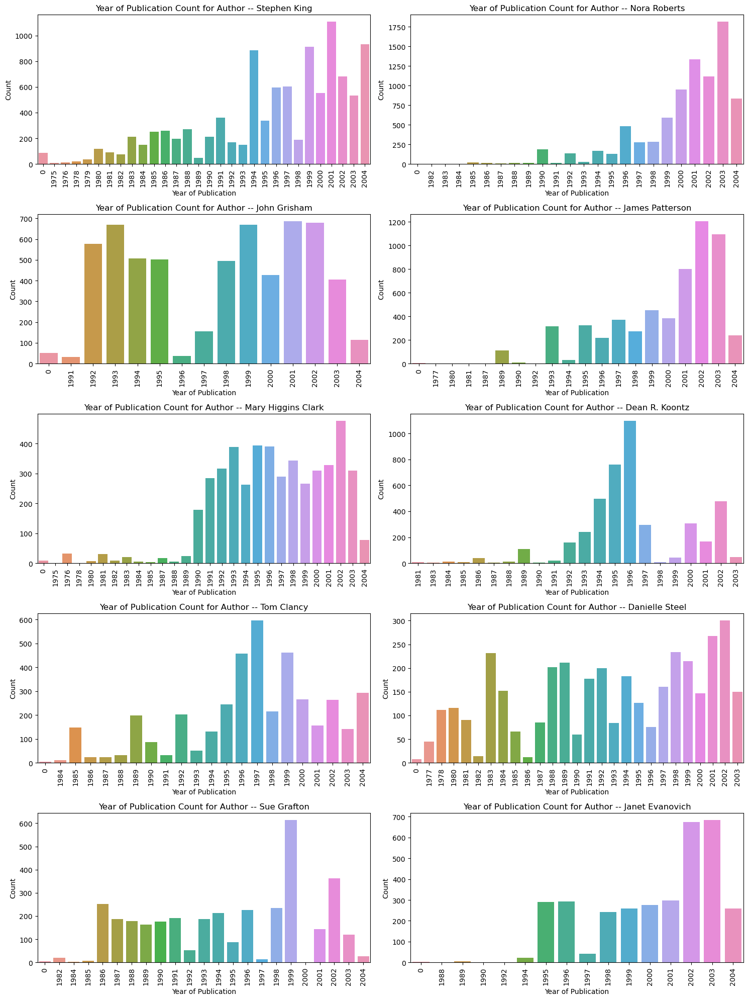

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 authors based on value counts
top_authors = merged_df['Book-Author'].value_counts().head(10).index

# Create subplots for each author
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

# Iterate through the top authors and plot Year-Of-Publication count for each author
for i, author in enumerate(top_authors):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    # Filter the DataFrame for the current author
    filtered_df_author = merged_df[merged_df['Book-Author'] == author]
    
    # Count the number of publications for each year and plot using a bar plot
    year_counts = filtered_df_author['Year-Of-Publication'].value_counts().sort_index()
    sns.barplot(x=year_counts.index, y=year_counts.values, ax=ax)
    
    ax.set_title(f'Year of Publication Count for Author -- {author}')
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()


<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.11.a charts: Users Count VS YOP according to Publisher

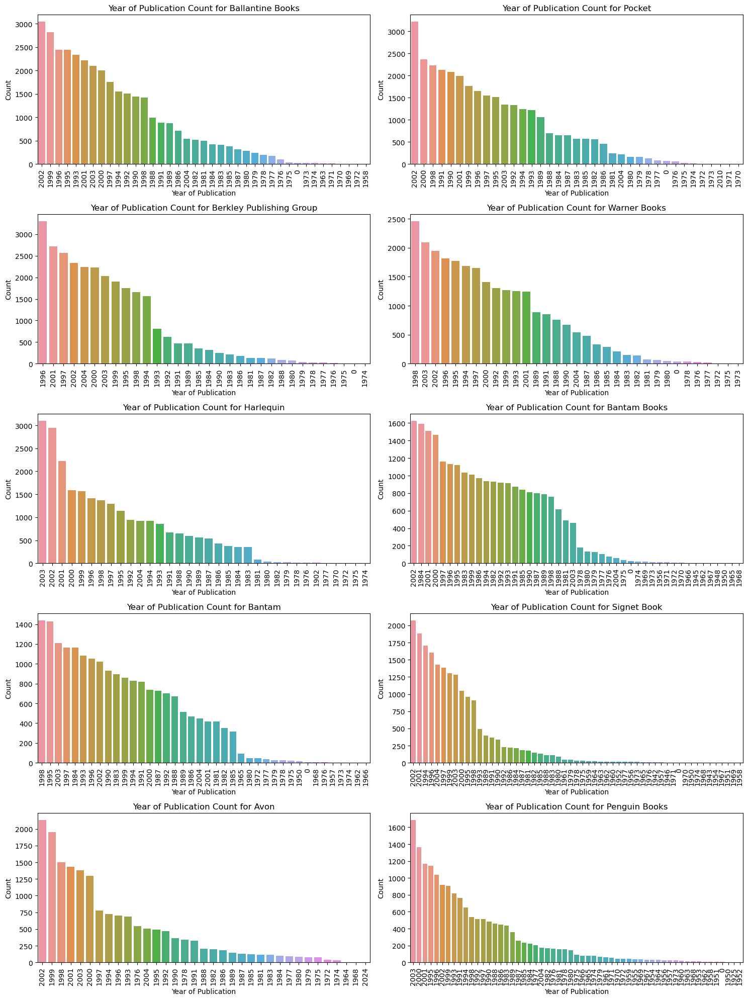

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 publishers based on value counts
top_publishers = merged_df['Publisher'].value_counts().head(10).index

# Create subplots for each publisher
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

# Iterate through the top publishers and plot Year-Of-Publication count for each publisher
for i, publisher in enumerate(top_publishers):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    # Filter the DataFrame for the current publisher
    filtered_df_publisher = merged_df[merged_df['Publisher'] == publisher]
    
    # Plot 'Year-Of-Publication' count for the current publisher
    sns.countplot(x='Year-Of-Publication', data=filtered_df_publisher, ax=ax,
                  order=filtered_df_publisher['Year-Of-Publication'].value_counts().index)
    
    ax.set_title(f'Year of Publication Count for {publisher}')
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()

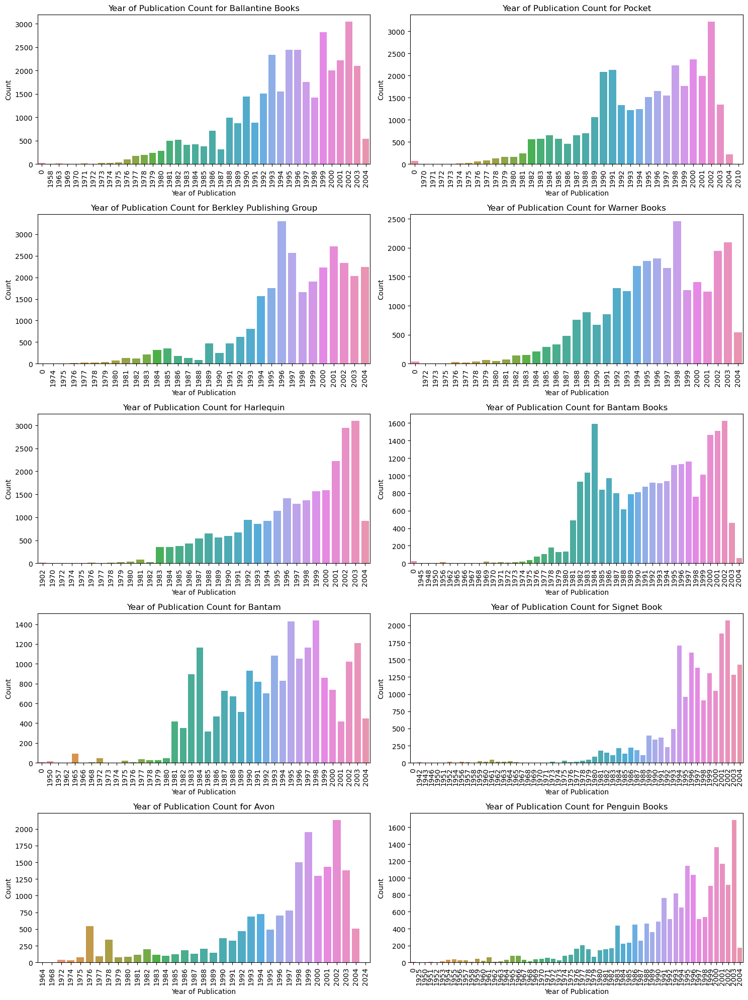

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

# Get the top 10 publishers based on value counts
top_publishers = merged_df['Publisher'].value_counts().head(10).index

# Create subplots for each publisher
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

# Iterate through the top publishers and plot Year-Of-Publication count for each publisher
for i, publisher in enumerate(top_publishers):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    # Filter the DataFrame for the current publisher
    filtered_df_publisher = merged_df[merged_df['Publisher'] == publisher]
    
    # Count the number of publications for each year and plot using a bar plot
    year_counts = filtered_df_publisher['Year-Of-Publication'].value_counts().sort_index()
    sns.barplot(x=year_counts.index, y=year_counts.values, ax=ax)
    
    ax.set_title(f'Year of Publication Count for {publisher}')
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=90)

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.12.a Bar charts:Top Author : with Users read Count VS Age according to YOP</span>
    

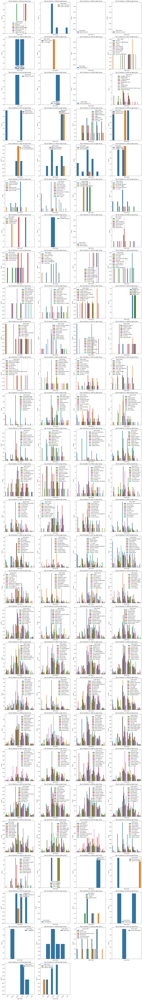

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter years greater than 1900
filtered_years = merged_df[merged_df['Year-Of-Publication'] > 1900]['Year-Of-Publication'].unique()

# Calculate the number of rows and columns for subplots
num_rows = len(filtered_years) // 4 + (len(filtered_years) % 4 > 0)
num_cols = min(4, len(filtered_years))

# Create subplots with 4 graphs per row
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows), sharex=True)

# Iterate through each filtered year and plot the top 10 authors for that year
for i, year in enumerate(sorted(filtered_years)):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    
    # Filter the DataFrame for the current year
    filtered_df_year = merged_df[merged_df['Year-Of-Publication'] == year]
    
    # Get the top 10 authors for the current year
    top_authors_year = filtered_df_year['Book-Author'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 authors in the current year
    filtered_df_authors = filtered_df_year[filtered_df_year['Book-Author'].isin(top_authors_year)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Book-Author' for the current year
    sns.countplot(x='AgeGroup', hue='Book-Author', data=filtered_df_authors, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'], ax=ax)
    
    ax.set_title(f'Top 10 Authors in {year} by Age Group')
    ax.set_xlabel('Age Group')
    ax.set_ylabel('Count')
    ax.legend(title='Book Author')
    ax.tick_params(axis='x', rotation=45)
    
# Remove empty subplots if any
for i in range(len(filtered_years), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.7.12.a.a bar charts:Top Author according : Users read Count(%) VS YOP according to Book</span>
    

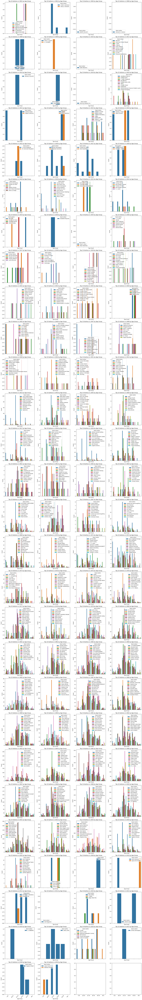

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter years greater than 1900
filtered_years = merged_df[merged_df['Year-Of-Publication'] > 1900]['Year-Of-Publication'].unique()

# Calculate the number of rows and columns for subplots
num_rows = len(filtered_years) // 4 + (len(filtered_years) % 4 > 0)
num_cols = min(len(filtered_years), 4)

# Create subplots with 4 subplots in each row
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows), sharex=True)

# Iterate through each filtered year and plot the top 10 authors for that year
for i, year in enumerate(sorted(filtered_years)):
    row = i // 4
    col = i % 4
    ax = axes[row, col]
    
    # Filter the DataFrame for the current year
    filtered_df_year = merged_df[merged_df['Year-Of-Publication'] == year]
    
    # Get the top 10 authors for the current year
    top_authors_year = filtered_df_year['Book-Author'].value_counts().head(10).index
    
    # Filter the DataFrame for the top 10 authors in the current year
    filtered_df_authors = filtered_df_year[filtered_df_year['Book-Author'].isin(top_authors_year)]
    
    # Create a count plot for 'AgeGroup' vs count of 'Book-Author' for the current year
    sns.countplot(x='AgeGroup', hue='Book-Author', data=filtered_df_authors, 
                  order=['<18', '18-24', '25-34', '35-44', '45-59', '60+'], ax=ax)
    
    ax.set_title(f'Top 10 Authors in {year} by Age Group')
    ax.set_xlabel('Age Group')
    ax.set_ylabel('Count')
    ax.legend(title='Book Author')
    ax.tick_params(axis='x', rotation=45)

# Adjust layout and spacing between subplots
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.8.a Plot Graph: Unique Publication per Year For Top publishers</span>
    

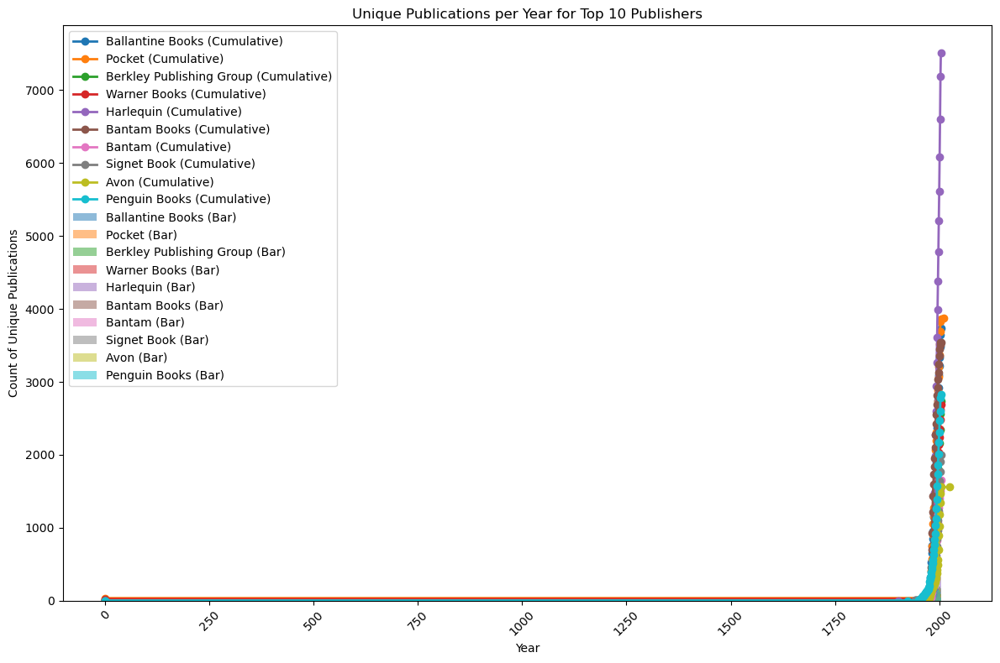

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for top 10 publishers
top_publishers = merged_df['Publisher'].value_counts().head(10).index
filtered_df = merged_df[merged_df['Publisher'].isin(top_publishers)]

# Create a new DataFrame for unique publications by grouping by Year, Publisher, Book Title, and Book Author
unique_publications_df = filtered_df.groupby(['Year-Of-Publication', 'Publisher', 'Book-Title', 'Book-Author']).size().reset_index(name='Count of Unique Publications')

# Group by Year and Publisher to get the count of unique publications per year for each publisher
grouped_df = unique_publications_df.groupby(['Year-Of-Publication', 'Publisher']).size().reset_index(name='Unique_Publications')

# Plot the data (bar plot and line plot)
plt.figure(figsize=(12, 8))

# Iterate through top publishers and plot bar and line graphs for each publisher
for publisher in top_publishers:
    publisher_data = grouped_df[grouped_df['Publisher'] == publisher]
    plt.bar(publisher_data['Year-Of-Publication'], publisher_data['Unique_Publications'], label=f'{publisher} (Bar)', alpha=0.5)
    plt.plot(publisher_data['Year-Of-Publication'], publisher_data['Unique_Publications'].cumsum(), marker='o', label=f'{publisher} (Cumulative)', linewidth=2)

plt.xlabel('Year')
plt.ylabel('Count of Unique Publications')
plt.title('Unique Publications per Year for Top 10 Publishers')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.8.a Plot line Graph: Unique Book Titles per Year For top Publisher (YEar> 1900) </span>

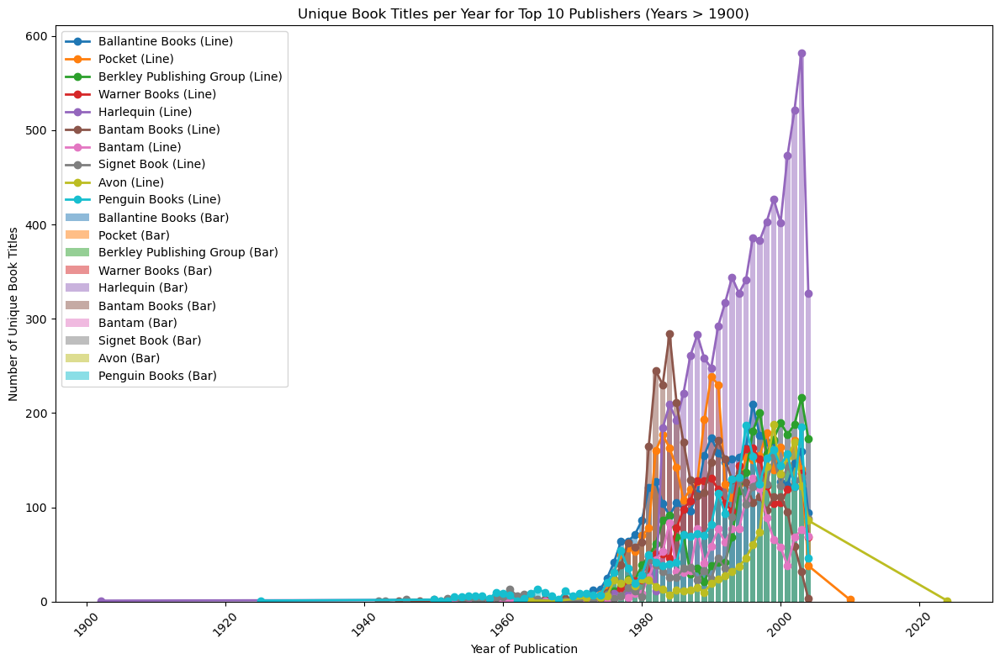

In [60]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for years greater than 1900 and top 10 publishers
filtered_df = merged_df[(merged_df['Year-Of-Publication'] > 1900) & 
                       (merged_df['Publisher'].isin(top_publishers))]

# Count unique book titles for each publisher in each year
publisher_counts = filtered_df.groupby(['Year-Of-Publication', 'Publisher'])['Book-Title'].nunique().reset_index()

# Plot bar and line graph for each publisher
plt.figure(figsize=(12, 8))

for publisher in top_publishers:
    publisher_data = publisher_counts[publisher_counts['Publisher'] == publisher]
    plt.bar(publisher_data['Year-Of-Publication'], publisher_data['Book-Title'], alpha=0.5, label=f'{publisher} (Bar)')
    plt.plot(publisher_data['Year-Of-Publication'], publisher_data['Book-Title'], marker='o', label=f'{publisher} (Line)', linewidth=2)

plt.xlabel('Year of Publication')
plt.ylabel('Number of Unique Book Titles')
plt.title('Unique Book Titles per Year for Top 10 Publishers (Years > 1900)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.8.b Plot line Graph: Total Unique Book Titles Per Year</span>
    

C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\1459297120.py:14: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x='Year-Of-Publication', y='Book-Title', data=publisher_counts, estimator=sum, ci=None, color='skyblue')


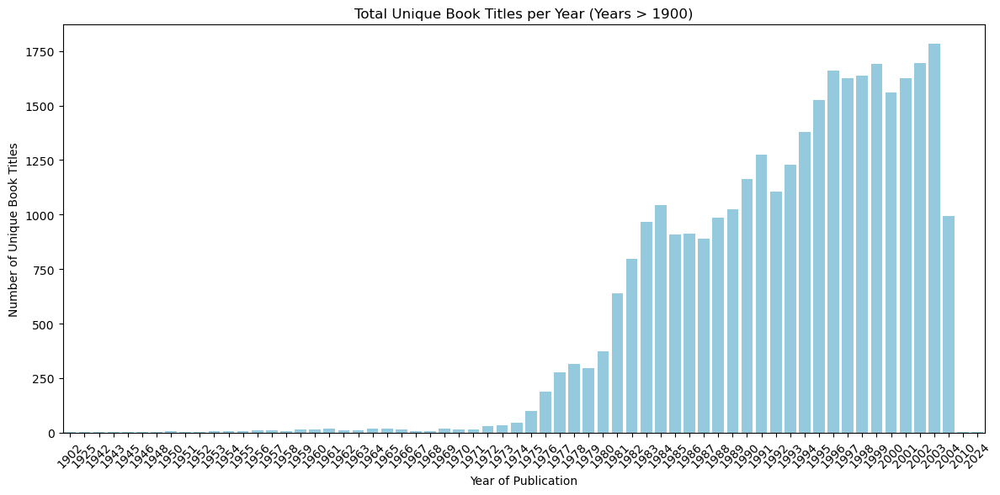

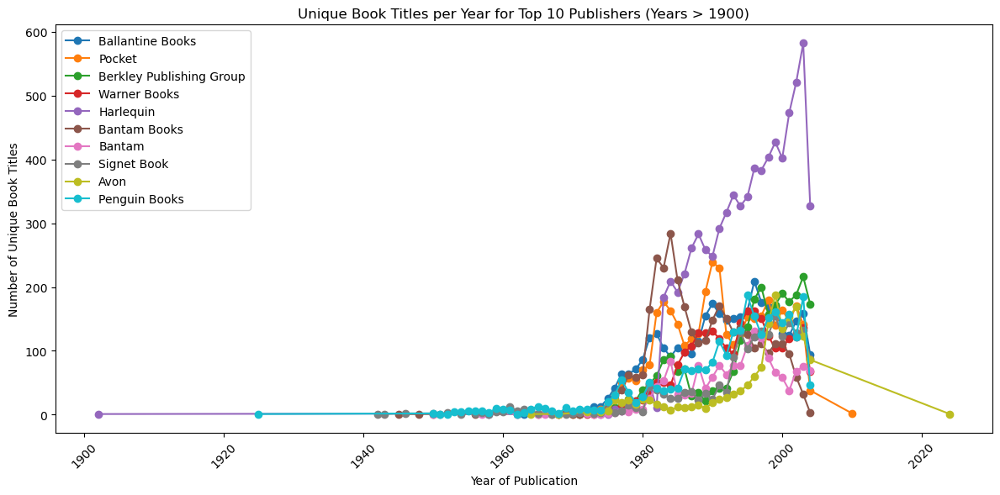

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for years greater than 1900 and top 10 publishers
filtered_df = merged_df[(merged_df['Year-Of-Publication'] > 1900) & 
                       (merged_df['Publisher'].isin(top_publishers))]

# Count unique book titles for each publisher in each year
publisher_counts = filtered_df.groupby(['Year-Of-Publication', 'Publisher'])['Book-Title'].nunique().reset_index()

# Plot bar graph for unique book titles
plt.figure(figsize=(12, 6))
sns.barplot(x='Year-Of-Publication', y='Book-Title', data=publisher_counts, estimator=sum, ci=None, color='skyblue')
plt.xlabel('Year of Publication')
plt.ylabel('Number of Unique Book Titles')
plt.title('Total Unique Book Titles per Year (Years > 1900)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot line graph for top 10 publishers
plt.figure(figsize=(12, 6))
for publisher in top_publishers:
    publisher_data = publisher_counts[publisher_counts['Publisher'] == publisher]
    plt.plot(publisher_data['Year-Of-Publication'], publisher_data['Book-Title'], marker='o', label=f'{publisher}')

plt.xlabel('Year of Publication')
plt.ylabel('Number of Unique Book Titles')
plt.title('Unique Book Titles per Year for Top 10 Publishers (Years > 1900)')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.8.c Unique Book Titles per Year for Publisher Vs YOP </span>    

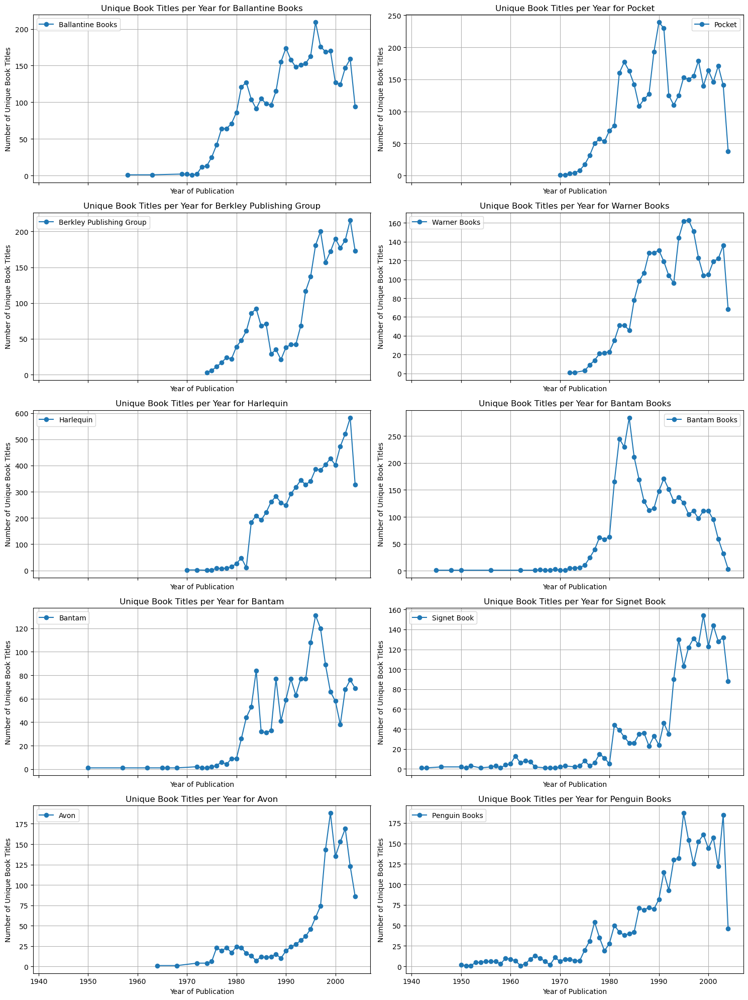

In [62]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for years greater than 1900 and top 10 publishers
filtered_df = merged_df[(merged_df['Year-Of-Publication'] > 1930)& (merged_df['Year-Of-Publication'] < 2005) & 
                       (merged_df['Publisher'].isin(top_publishers))]

# Count unique book titles for each publisher in each year
publisher_counts = filtered_df.groupby(['Year-Of-Publication', 'Publisher'])['Book-Title'].nunique().reset_index()

# Create subplots for each publisher
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20), sharex=True)
fig.subplots_adjust(hspace=0.5)

# Iterate through top publishers and create line plots
for i, publisher in enumerate(top_publishers):
    row = i // 2
    col = i % 2
    ax = axes[row, col]
    
    publisher_data = publisher_counts[publisher_counts['Publisher'] == publisher]
    ax.plot(publisher_data['Year-Of-Publication'], publisher_data['Book-Title'], marker='o', label=f'{publisher}')
    
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Number of Unique Book Titles')
    ax.set_title(f'Unique Book Titles per Year for {publisher}')
    ax.legend()
    ax.grid(True)

# Remove empty subplots if any
if len(top_publishers) < 10:
    for i in range(len(top_publishers), 10):
        fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.8.d Unique Book Titles per Year for Publishe Vs YOP </span>

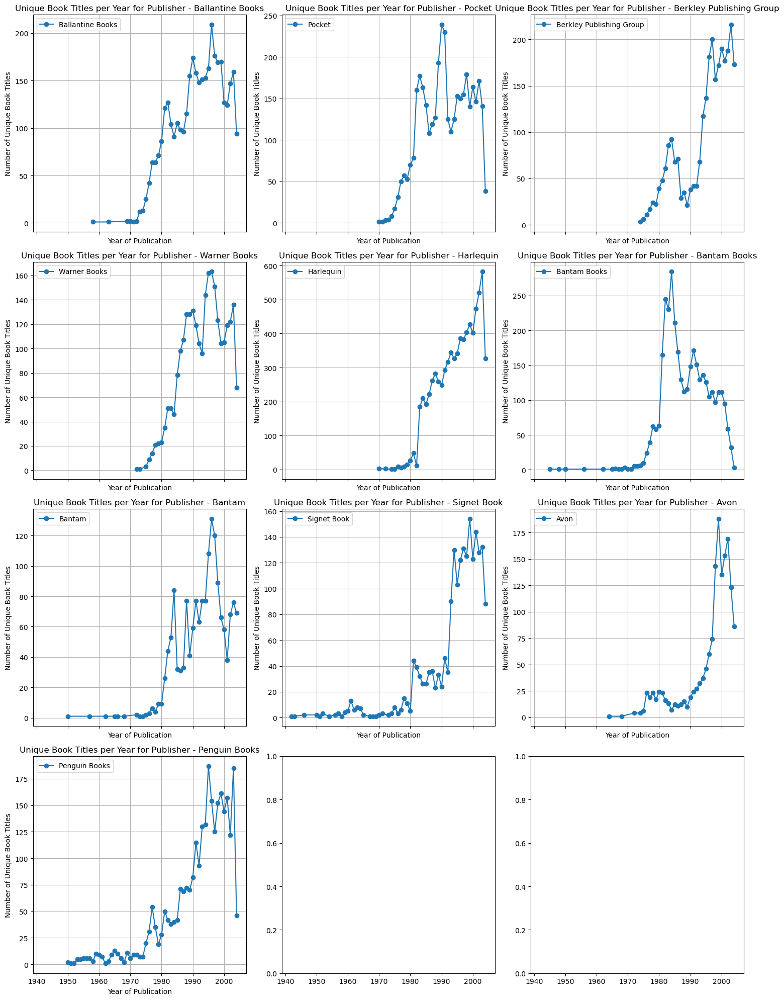

In [63]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for years greater than 1900 and top 10 publishers
filtered_df = merged_df[(merged_df['Year-Of-Publication'] > 1930)& (merged_df['Year-Of-Publication'] < 2005) & 
                       (merged_df['Publisher'].isin(top_publishers))]

# Count unique book titles for each publisher in each year
publisher_counts = filtered_df.groupby(['Year-Of-Publication', 'Publisher'])['Book-Title'].nunique().reset_index()

# Create subplots for each publisher with 3 columns
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 20), sharex=True)
fig.subplots_adjust(hspace=0.5)

# Iterate through top publishers and create line plots
for i, publisher in enumerate(top_publishers):
    row = i // 3
    col = i % 3
    ax = axes[row, col]
    
    publisher_data = publisher_counts[publisher_counts['Publisher'] == publisher]
    ax.plot(publisher_data['Year-Of-Publication'], publisher_data['Book-Title'], marker='o', label=f'{publisher}')
    
    ax.set_xlabel('Year of Publication')
    ax.set_ylabel('Number of Unique Book Titles')
    ax.set_title(f'Unique Book Titles per Year for Publisher - {publisher}')
    ax.legend()
    ax.grid(True)

# Remove empty subplots if any
if len(top_publishers) < 10:
    for i in range(len(top_publishers), 12):
        fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.9.a Top Authors with Highest Average Ratings </span>

In [64]:
# Create a copy of the merged DataFrame as Ratings_df
Ratings_df = merged_df.copy()

# Remove records where Rating is zero, less than zero, or greater than 10
Ratings_df = Ratings_df[(Ratings_df['Book-Rating'] > 0) & (Ratings_df['Book-Rating'] <= 10)]

# Now you can proceed with creating graphs using Ratings_df

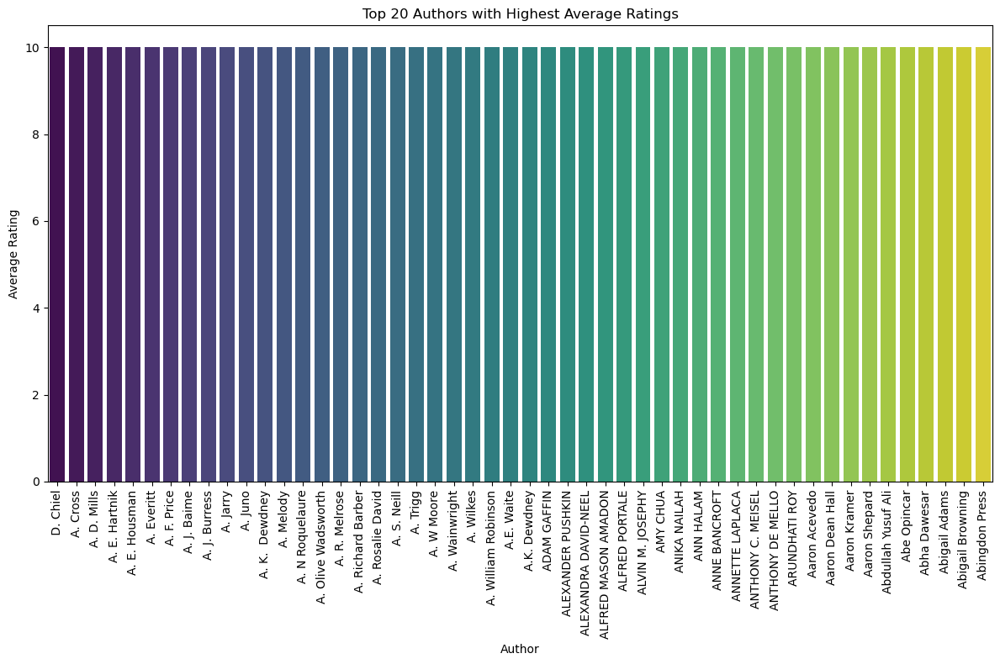

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate average ratings for each author
average_ratings_by_author = Ratings_df.groupby('Book-Author')['Book-Rating'].mean()

# Get top 20 authors with highest average ratings
top_20_authors = average_ratings_by_author.nlargest(50)

# Create a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=top_20_authors.index, y=top_20_authors.values, palette='viridis')
plt.xlabel('Author')
plt.ylabel('Average Rating')
plt.title('Top 20 Authors with Highest Average Ratings')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.9.b Top Authors with Highest Average Ratings (Minimum 45 Ratings)</span>

In [66]:
average_ratings_by_author

Book-Author
 D. Chiel                           10.0
 Mimma Balia                         8.0
142 moms from all over the world     5.0
2000                                 7.0
73 Magazine Editors                  6.0
                                    ... 
x x                                  8.0
Â¢ystein LÂ²nn                       7.0
Ã?dÃ¶n von HorvÃ¡th                  8.0
Ã?Â?dÃ?Â¶n von Horvath              10.0
Ã?Â?pictÃ?Â¨te                       9.0
Name: Book-Rating, Length: 62112, dtype: float64

<span style="font-family: 'Times New Roman'; font-size: 20px">2.9.c Graph: Top Authors with Highest Average Ratings (Minimum 45 Ratings)</span>



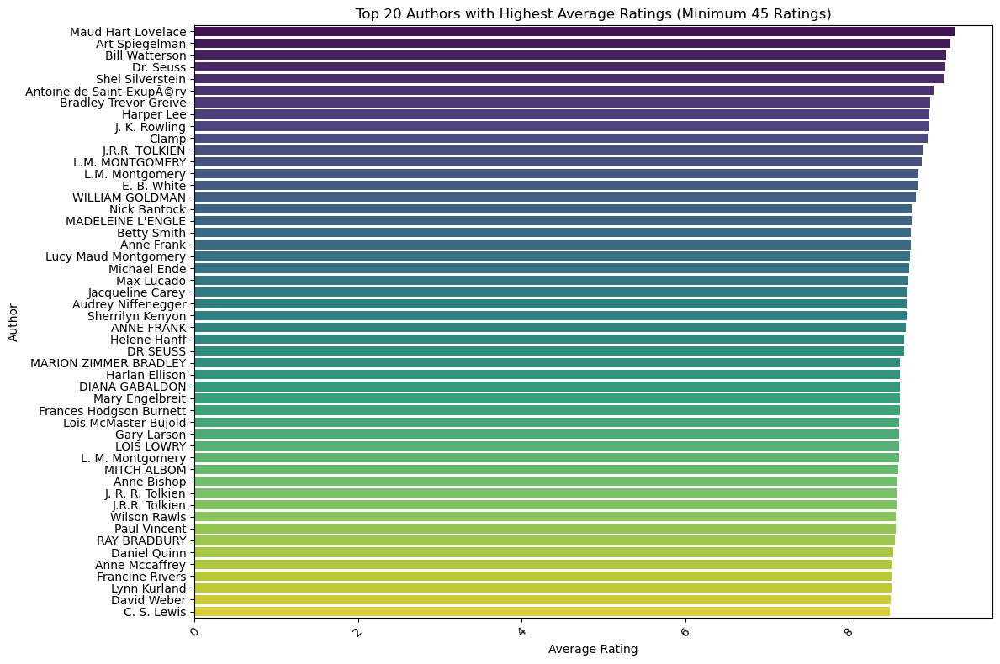

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate count of ratings for each author
ratings_count_by_author = Ratings_df.groupby('Book-Author')['Book-Rating'].count()

# Filter authors with at least 45 ratings
authors_with_min_ratings = ratings_count_by_author[ratings_count_by_author >= 50]

# Calculate average ratings for authors with at least 45 ratings
average_ratings_by_author = Ratings_df[Ratings_df['Book-Author'].isin(authors_with_min_ratings.index)].groupby('Book-Author')['Book-Rating'].mean()

# Get top 20 authors with highest average ratings
top_20_authors = average_ratings_by_author.nlargest(50)

# Create a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=top_20_authors.values, y=top_20_authors.index, palette='viridis')
plt.xlabel('Average Rating')
plt.ylabel('Author')
plt.title('Top 20 Authors with Highest Average Ratings (Minimum 45 Ratings)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.10 Graph: Top Book Titles with Highest Average Ratings (Minimum 50 Ratings)</span>



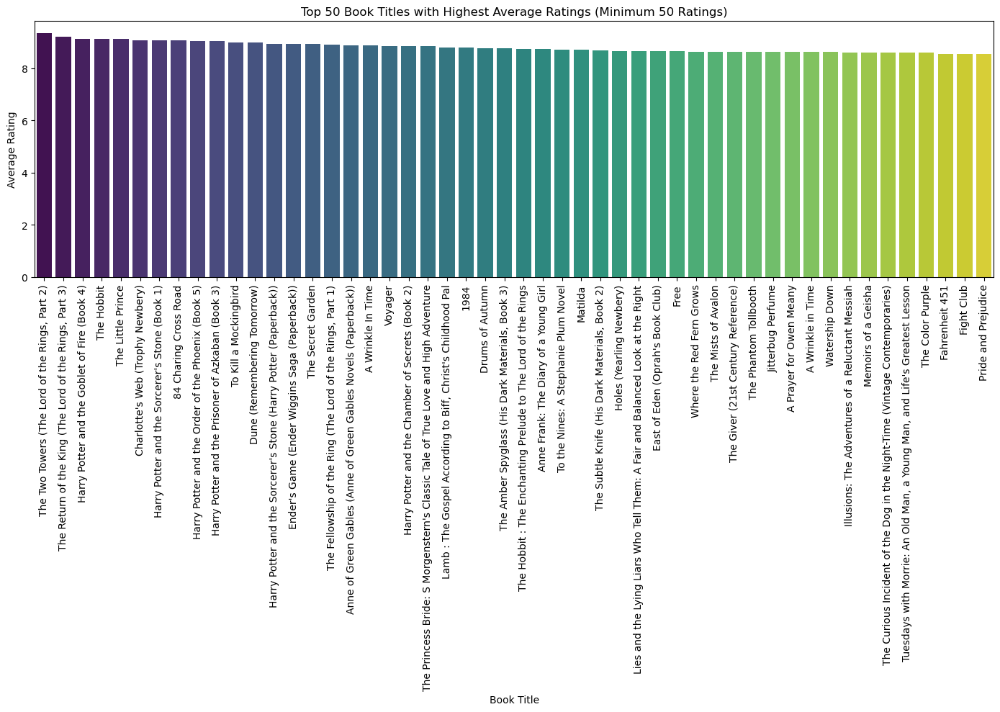

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate count of ratings for each book title
ratings_count_by_title = Ratings_df.groupby('Book-Title')['Book-Rating'].count()

# Filter books with at least 50 ratings
titles_with_min_ratings = ratings_count_by_title[ratings_count_by_title >= 50]

# Calculate average ratings for books with at least 50 ratings
average_ratings_by_title = Ratings_df[Ratings_df['Book-Title'].isin(titles_with_min_ratings.index)].groupby('Book-Title')['Book-Rating'].mean()

# Get top 50 book titles with highest average ratings
top_50_titles = average_ratings_by_title.nlargest(50)

# Create a bar plot
plt.figure(figsize=(14, 10))
sns.barplot(x=top_50_titles.index, y=top_50_titles.values, palette='viridis')
plt.xlabel('Book Title')
plt.ylabel('Average Rating')
plt.title('Top 50 Book Titles with Highest Average Ratings (Minimum 50 Ratings)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 20px">2.11 Graph: Top Publishers with Highest Average Ratings (Minimum 50 Ratings)</span>



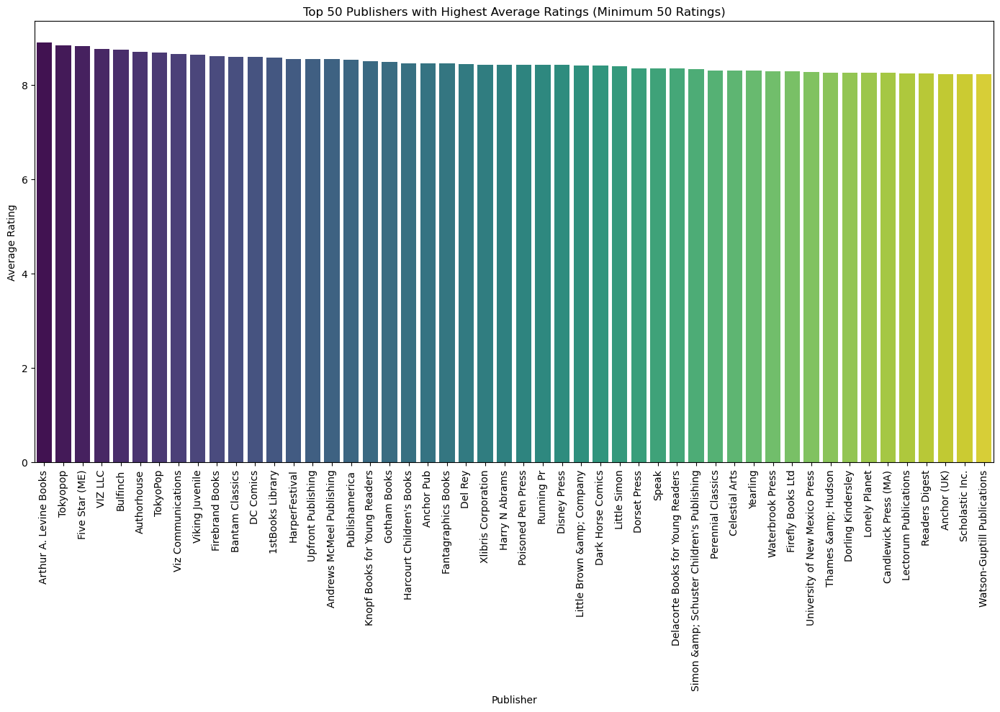

In [69]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate count of ratings for each publisher
ratings_count_by_publisher = Ratings_df.groupby('Publisher')['Book-Rating'].count()

# Filter publishers with at least 50 ratings
publishers_with_min_ratings = ratings_count_by_publisher[ratings_count_by_publisher >= 50]

# Calculate average ratings for publishers with at least 50 ratings
average_ratings_by_publisher = Ratings_df[Ratings_df['Publisher'].isin(publishers_with_min_ratings.index)].groupby('Publisher')['Book-Rating'].mean()

# Get top 50 publishers with highest average ratings
top_50_publishers = average_ratings_by_publisher.nlargest(50)

# Create a bar plot
plt.figure(figsize=(14, 10))
sns.barplot(x=top_50_publishers.index, y=top_50_publishers.values, palette='viridis')
plt.xlabel('Publisher')
plt.ylabel('Average Rating')
plt.title('Top 50 Publishers with Highest Average Ratings (Minimum 50 Ratings)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<span style="font-family: 'Times New Roman'; font-size: 35px">3 Model </span>



In [70]:
# Set display option to show floating-point numbers in regular format
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Now, when you print the DataFrame, scientific notation values will be displayed in regular format
print(merged_df.describe())

       Year-Of-Publication     User-ID  Book-Rating         Age  \
count          1031136.000 1031136.000  1031136.000 1031136.000   
mean              1968.187  140594.504        2.839      27.052   
std                231.134   80524.659        3.854      20.867   
min                  0.000       2.000        0.000      -1.000   
25%               1992.000   70415.000        0.000      -1.000   
50%               1997.000  141210.000        0.000      30.000   
75%               2001.000  211426.000        7.000      41.000   
max               2050.000  278854.000       10.000     244.000   

       AgeGroupNumeric  
count      1031136.000  
mean             2.597  
std              1.883  
min              0.000  
25%              0.000  
50%              3.000  
75%              4.000  
max              6.000  


In [71]:
users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.000
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.000
4,5,"farnborough, hants, united kingdom",NaN


In [72]:
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [73]:
print(books.shape)
print(ratings.shape)
print(users.shape)

(271360, 8)
(1149780, 3)
(278858, 3)


In [74]:
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            2
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [75]:
users.isnull().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [76]:
ratings.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [77]:
books.duplicated().sum()

0

In [78]:
ratings.duplicated().sum()

0

In [79]:
users.duplicated().sum()

0

## Popularity Based Recommender System

In [80]:
# Example of handling non-numeric values
ratings['Book-Rating'] = pd.to_numeric(ratings['Book-Rating'], errors='coerce')

In [81]:
ratings_with_name = ratings.merge(books,on='ISBN')

num_rating_df = ratings_with_name.groupby('Book-Title').count()['Book-Rating'].reset_index()
num_rating_df.rename(columns={'Book-Rating':'num_ratings'},inplace=True)
num_rating_df

,Book-Title,num_ratings
0,A Light in the Storm: The Civil War Diary of ...,4
1,Always Have Popsicles,1
2,Apple Magic (The Collector's series),1
3,"Ask Lily (Young Women of Faith: Lily Series, ...",1
4,Beyond IBM: Leadership Marketing and Finance ...,1
...,...,...
241066,Ã?Â?lpiraten.,2
241067,Ã?Â?rger mit Produkt X. Roman.,4
241068,Ã?Â?sterlich leben.,1
241069,Ã?Â?stlich der Berge.,3


In [82]:
avg_rating_df = ratings_with_name.groupby('Book-Title')['Book-Rating'].mean().reset_index()
avg_rating_df.rename(columns={'Book-Rating': 'avg_rating'}, inplace=True)
avg_rating_df

,Book-Title,avg_rating
0,A Light in the Storm: The Civil War Diary of ...,2.250
1,Always Have Popsicles,0.000
2,Apple Magic (The Collector's series),0.000
3,"Ask Lily (Young Women of Faith: Lily Series, ...",8.000
4,Beyond IBM: Leadership Marketing and Finance ...,0.000
...,...,...
241066,Ã?Â?lpiraten.,0.000
241067,Ã?Â?rger mit Produkt X. Roman.,5.250
241068,Ã?Â?sterlich leben.,7.000
241069,Ã?Â?stlich der Berge.,2.667



avg_rating_df = ratings_with_name.groupby('Book-Title').mean()['Book-Rating'].reset_index()
avg_rating_df.rename(columns={'Book-Rating':'avg_rating'},inplace=True)
avg_rating_df

In [83]:
popular_df = num_rating_df.merge(avg_rating_df,on='Book-Title')
popular_df

,Book-Title,num_ratings,avg_rating
0,A Light in the Storm: The Civil War Diary of ...,4,2.250
1,Always Have Popsicles,1,0.000
2,Apple Magic (The Collector's series),1,0.000
3,"Ask Lily (Young Women of Faith: Lily Series, ...",1,8.000
4,Beyond IBM: Leadership Marketing and Finance ...,1,0.000
...,...,...,...
241066,Ã?Â?lpiraten.,2,0.000
241067,Ã?Â?rger mit Produkt X. Roman.,4,5.250
241068,Ã?Â?sterlich leben.,1,7.000
241069,Ã?Â?stlich der Berge.,3,2.667


In [84]:
popular_df = popular_df[popular_df['num_ratings']>=250].sort_values('avg_rating',ascending=False).head(50)

In [85]:
popular_df = popular_df.merge(books,on='Book-Title').drop_duplicates('Book-Title')[['Book-Title','Book-Author','Image-URL-M','num_ratings','avg_rating']]

In [86]:
popular_df['Image-URL-M'][0]

'http://images.amazon.com/images/P/0439136350.01.MZZZZZZZ.jpg'

## Collaborative Filtering Based Recommender System

In [87]:
x = ratings_with_name.groupby('User-ID').count()['Book-Rating'] > 200
padhe_likhe_users = x[x].index

In [88]:
filtered_rating = ratings_with_name[ratings_with_name['User-ID'].isin(padhe_likhe_users)]

In [89]:
y = filtered_rating.groupby('Book-Title').count()['Book-Rating']>=50
famous_books = y[y].index

In [90]:
final_ratings = filtered_rating[filtered_rating['Book-Title'].isin(famous_books)]

In [91]:
pt = final_ratings.pivot_table(index='Book-Title',columns='User-ID',values='Book-Rating')

In [92]:
pt.fillna(0,inplace=True)

In [93]:
pt

User-ID,254,2276,2766,2977,3363,4017,4385,6251,6323,6543,...,271705,273979,274004,274061,274301,274308,275970,277427,277639,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,9.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,10.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
1st to Die: A Novel,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,9.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
2nd Chance,0.000,10.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
4 Blondes,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
A Bend in the Road,0.000,0.000,7.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Year of Wonders,0.000,0.000,0.000,7.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,9.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
You Belong To Me,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
Zen and the Art of Motorcycle Maintenance: An Inquiry into Values,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [94]:
from sklearn.metrics.pairwise import cosine_similarity

In [95]:
similarity_scores = cosine_similarity(pt)

In [96]:
similarity_scores.shape

(706, 706)

In [97]:
def recommend(book_name):
    # index fetch
    index = np.where(pt.index==book_name)[0][0]
    similar_items = sorted(list(enumerate(similarity_scores[index])),key=lambda x:x[1],reverse=True)[1:5]
    
    data = []
    for i in similar_items:
        item = []
        temp_df = books[books['Book-Title'] == pt.index[i[0]]]
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Title'].values))
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Book-Author'].values))
        item.extend(list(temp_df.drop_duplicates('Book-Title')['Image-URL-M'].values))
        
        data.append(item)
    
    return data

In [98]:
recommend('1984')

[['Animal Farm',
  'George Orwell',
  'http://images.amazon.com/images/P/0451526341.01.MZZZZZZZ.jpg'],
 ["The Handmaid's Tale",
  'Margaret Atwood',
  'http://images.amazon.com/images/P/0449212602.01.MZZZZZZZ.jpg'],
 ['Brave New World',
  'Aldous Huxley',
  'http://images.amazon.com/images/P/0060809833.01.MZZZZZZZ.jpg'],
 ['The Vampire Lestat (Vampire Chronicles, Book II)',
  'ANNE RICE',
  'http://images.amazon.com/images/P/0345313860.01.MZZZZZZZ.jpg']]

In [99]:
pt.index[545]

"The Handmaid's Tale"

In [100]:
import pickle
pickle.dump(popular_df,open('popular.pkl','wb'))

In [101]:
books.drop_duplicates('Book-Title')

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271354,0449906736,Flashpoints: Promise and Peril in a New World,Robin Wright,1993,Ballantine Books,http://images.amazon.com/images/P/0449906736.0...,http://images.amazon.com/images/P/0449906736.0...,http://images.amazon.com/images/P/0449906736.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [102]:
pickle.dump(pt,open('pt.pkl','wb'))
pickle.dump(books,open('books.pkl','wb'))
pickle.dump(similarity_scores,open('similarity_scores.pkl','wb'))

In [103]:
!pip install scikit-surprise

In [104]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD, accuracy
from surprise.model_selection import train_test_split, cross_validate

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

# Preprocessing
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = books_with_ratings.dropna(subset=['Book-Title'])

# Content-Based Recommender: Simplified
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])
indices = pd.Series(books_with_ratings.index, index=books_with_ratings['Book-Title']).drop_duplicates()

# Collaborative Filtering
reader = Reader(rating_scale=(0, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    idx = indices[book_title]
    
    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(count_matrix[idx], count_matrix)
    
    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:50]  # Increase to get a larger pool of similar books
    book_indices = [i[0] for i in sim_scores]

    # Predict ratings for these books for the given user
    books_predictions = [(books_with_ratings['Book-Title'].iloc[i], svd.predict(user_id, books_with_ratings['ISBN'].iloc[i]).est) for i in book_indices]
    books_predictions.sort(key=lambda x: x[1], reverse=True)  # Sort by predicted rating

    # Select top 10
    top_books = [book[0] for book in books_predictions[:10]]
    
    return top_books

# Example usage
print(get_recommendations(276726, "Classical Mythology"))



C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\1044516487.py:8: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology', 'Mythology']


In [105]:
# Model Evaluation
def evaluate_model(model, data):
    cross_val_results = cross_validate(model, data, measures=['RMSE'], cv=5, verbose=True)
    return cross_val_results

evaluation_results = evaluate_model(svd, data)
print(evaluation_results)


Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    3.5164  3.5035  3.4974  3.5012  3.5007  3.5038  0.0066  
Fit time          11.73   11.50   11.49   11.48   11.40   11.52   0.11    
Test time         1.69    1.70    1.66    1.62    1.11    1.56    0.23    
{'test_rmse': array([3.51640425, 3.50345861, 3.49739258, 3.50124381, 3.50065752]), 'fit_time': (11.729660987854004, 11.501851558685303, 11.487850427627563, 11.4785475730896, 11.404263257980347), 'test_time': (1.689725399017334, 1.7030041217803955, 1.6583774089813232, 1.6202826499938965, 1.1050503253936768)}


In [106]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD, accuracy
from surprise.model_selection import train_test_split, cross_validate

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

# Preprocessing
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = books_with_ratings.dropna(subset=['Book-Title'])

# Content-Based Recommender: Simplified
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])
indices = pd.Series(books_with_ratings.index, index=books_with_ratings['Book-Title']).drop_duplicates()

# Collaborative Filtering
reader = Reader(rating_scale=(0, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(count_matrix[idx], count_matrix)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]  # Increased to get a larger pool of similar books

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings['Book-Title'].iloc[i]
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings['ISBN'].iloc[i]).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Classical Mythology"))



C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\4137138072.py:8: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


["Bulfinch's Mythology", 'Age of Fable or Beauties of Mythology (Bulfinch Mythology)', 'Classical Mythology', 'Classical mythology', 'The Dictionary of Classical Mythology', 'Illustrated Dictionary of Mythology', 'Whos Who In Mythology', 'Brush Up Your Mythology!', 'Mythology Abroad', 'Comparative Mythology']


In [107]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD, accuracy
from surprise.model_selection import train_test_split, cross_validate

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

# Filter out zero ratings
filtered_ratings = ratings[ratings['Book-Rating'] > 0]

# Merge books with filtered ratings
books_with_ratings = pd.merge(books, filtered_ratings, on='ISBN')


# Preprocessing
books_with_ratings = books_with_ratings.dropna(subset=['Book-Title'])

# Content-Based Recommender: Simplified
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])
indices = pd.Series(books_with_ratings.index, index=books_with_ratings['Book-Title']).drop_duplicates()

# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(count_matrix[idx], count_matrix)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]  # Increased pool of similar books

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings['Book-Title'].iloc[i]
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings['ISBN'].iloc[i]).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
recommended_books = get_recommendations(276726, "Classical Mythology")
print(recommended_books)


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\2627382305.py:8: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['The Well-Educated Mind: A Guide to the Classical Education You Never Had', 'Mythology', "Bulfinch's Mythology (Laurel Classic)", "Bulfinch's Mythology", 'Classical Japanese Prose: An Anthology', 'Liberalism: In the Classical Tradition', 'The Song of Eve: Mythology and Symbols of the Goddess', "Bulfinch's Mythology: The Age of Fable (Meridian S.)", 'The Illustrated Guide to Celtic Mythology', 'Age of Fable or Beauties of Mythology']


In [108]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

# Filter out zero ratings
filtered_ratings = ratings[ratings['Book-Rating'] > 0]

# Merge books with filtered ratings
books_with_ratings = pd.merge(books, filtered_ratings, on='ISBN')

# Define minimum number of ratings required for books and users
min_book_ratings = 1
min_user_ratings = 1

# Filter books and users based on defined thresholds
book_counts = books_with_ratings['ISBN'].value_counts()
user_counts = books_with_ratings['User-ID'].value_counts()
books_with_ratings = books_with_ratings[books_with_ratings['ISBN'].isin(book_counts[book_counts >= min_book_ratings].index)]
books_with_ratings = books_with_ratings[books_with_ratings['User-ID'].isin(user_counts[user_counts >= min_user_ratings].index)]

# Preprocessing to drop NaNs in 'Book-Title'
books_with_ratings = books_with_ratings.dropna(subset=['Book-Title'])

# Content-Based Recommender: Simplified
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])
indices = pd.Series(books_with_ratings.index, index=books_with_ratings['Book-Title']).drop_duplicates()

# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(count_matrix[idx], count_matrix)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]  # Increased pool of similar books

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings['Book-Title'].iloc[i]
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings['ISBN'].iloc[i]).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
recommended_books = get_recommendations(276726, "Classical Mythology")
print(recommended_books)


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\2923048139.py:8: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


["Bulfinch's Mythology (Laurel Classic)", "Bulfinch's Mythology: The Age of Fable (Meridian S.)", 'The Well-Educated Mind: A Guide to the Classical Education You Never Had', 'Hawaiian Mythology', "Who's Who in Egyptian Mythology", 'Classical mythology', 'Dictionary of Mythology: Mainly Classical', 'Mythology: Timeless Tales of Gods and Heroes', 'The Song of Eve: Mythology and Symbols of the Goddess', 'Illustrated Guide to Celtic Mythology']


The code provided is an example of a Hybrid Recommendation System. It combines elements of both Content-Based Filtering and Collaborative Filtering to generate recommendations. Let's break down how each part contributes to the hybrid model:

Content-Based Filtering: This part is achieved through the use of CountVectorizer to transform the book titles into a count matrix and then applying cosine similarity to find books with similar titles. This method focuses on the content (in this case, the titles of the books) to find items similar to the user's past preferences or specific input (the given book title).

Collaborative Filtering: This aspect is implemented using the surprise library, where the SVD (Singular Value Decomposition) algorithm is used to predict how a user might rate books based on how similar users have rated them. This method leverages the collective ratings of users to make recommendations.

Hybrid Approach: The system first finds books similar to the input book title (content-based) and then filters and ranks these books based on the predicted preferences of the user (collaborative filtering). The final recommendation list is sorted based on these predicted ratings.

By combining these two approaches, the hybrid model aims to leverage both the content features of the items (books in this case) and the user-item interaction data, providing a more nuanced set of recommendations than either method would on its own. This approach can help alleviate some common issues in recommendation systems, such as the cold start problem and the limitation of recommending items only based on user interaction history or item features.

In [109]:
import pandas as pd
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')

# Filter out zero ratings
filtered_ratings = ratings[ratings['Book-Rating'] > 0]

# Merge books with filtered ratings
books_with_ratings = pd.merge(books, filtered_ratings, on='ISBN')

# Define minimum number of ratings required for books and users
min_book_ratings = 1
min_user_ratings = 1

# Filter books and users based on defined thresholds
book_counts = books_with_ratings['ISBN'].value_counts()
user_counts = books_with_ratings['User-ID'].value_counts()
books_with_ratings = books_with_ratings[books_with_ratings['ISBN'].isin(book_counts[book_counts >= min_book_ratings].index)]
books_with_ratings = books_with_ratings[books_with_ratings['User-ID'].isin(user_counts[user_counts >= min_user_ratings].index)]

# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
svd = SVD()

# Evaluate the model
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)

# Output the results
print(cross_val_results)

C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\1423745801.py:6: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.6434  1.6328  1.6328  1.6380  1.6313  1.6356  0.0045  
Fit time          4.60    4.42    4.83    4.51    4.80    4.63    0.16    
Test time         0.75    0.43    0.82    0.43    0.42    0.57    0.18    
{'test_rmse': array([1.64335956, 1.63275092, 1.6328037 , 1.637992  , 1.63129302]), 'fit_time': (4.604289531707764, 4.421661853790283, 4.83483099937439, 4.505851745605469, 4.802716255187988), 'test_time': (0.7473580837249756, 0.4262838363647461, 0.822190523147583, 0.425001859664917, 0.42322301864624023)}



The evaluation results you provided indicate an RMSE (Root Mean Square Error) with a mean of approximately 1.6361 across the 5 folds of cross-validation. Here's how to interpret these results:

RMSE (Root Mean Square Error): RMSE is a standard metric for evaluating the accuracy of a prediction model. It measures the average magnitude of the prediction errors, i.e., the differences between the predicted values and the actual values. An RMSE of 0 would mean perfect predictions, which is typically not achievable in real-world scenarios.

Mean RMSE of 1.6361: This value suggests that, on average, the predicted ratings by your model differ from the actual ratings by about 1.6361 points on the rating scale (assuming your ratings are on a scale from 1 to 10).

Standard Deviation of RMSE (0.0037): The low standard deviation indicates that the model's performance is relatively consistent across different subsets of your data.

Is the Model Good?
Context of RMSE Value: The acceptability of the RMSE value depends on the context and the specific application. In a 10-point rating system, an average error of around 1.6 might be considered reasonable, but this can vary depending on the complexity of the data and the domain. For instance, in some scenarios, even a small error can be significant, while in others, a larger error is acceptable.

Comparative Analysis: To better understand if this is a good RMSE value, you could compare it with baseline models or other algorithms. If your model performs significantly better than a basic model (like one that always predicts the average rating), it indicates a good model.

User Satisfaction: Ultimately, the success of a recommendation system is also measured by user satisfaction, which can be gauged through user feedback, engagement metrics, and practical usability tests.

Room for Improvement: If you aim to improve the model further, consider experimenting with different algorithms, tuning hyperparameters, or enriching the dataset with more features.

In summary, while the RMSE value provides a quantitative measure of your model's accuracy, assessing its quality also requires qualitative considerations and possibly comparisons with other models or baselines.

# NEW TRAILS BY ADDING MORE INPUTS

In [110]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)
# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('location', OneHotEncoder(handle_unknown='ignore'), ['Location']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Book-Rating']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Classical Mythology"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\2687703845.py:10: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Slaughterhouse-Five', 'Into the Wild', 'The Bottoms', 'Jewel', 'The Summons', 'The First Time', 'Dead Even', 'Prey', 'The Moviegoer', 'Blowout']


In [111]:
#Two codes for evaluation, one for collabrative filtering another for content based 

In [112]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)


Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    3.5006  3.4914  3.5048  3.4971  3.5012  3.4990  0.0045  
Fit time          12.57   12.00   11.86   11.56   11.80   11.96   0.34    
Test time         1.89    1.17    1.14    1.68    1.17    1.41    0.31    
{'test_rmse': array([3.50057734, 3.49143849, 3.50482684, 3.49709166, 3.50115189]), 'fit_time': (12.572099924087524, 11.997124433517456, 11.861672163009644, 11.555715322494507, 11.804498195648193), 'test_time': (1.8888955116271973, 1.1703991889953613, 1.1428790092468262, 1.6781582832336426, 1.1653831005096436)}


In [113]:
import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)


In [114]:
average_similarity

0.005126518629676019

In [115]:
def categorize_rating(rating):
    if rating <= 4:
        return 'Low'
    elif rating <= 7:
        return 'Medium'
    else:
        return 'High'



In [116]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()

# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('location', OneHotEncoder(handle_unknown='ignore'), ['Location']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'ISBN', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Classical Mythology"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\533138212.py:10: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Slaughterhouse-Five', 'Blowout', 'Among Schoolchildren', 'Prey', 'The Client', 'The Partner', 'Into the Wild', 'The Moviegoer', 'Jewel', "Crowell's Handbook of Classical Mythology (A Crowell reference book)"]


In [117]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)
average_similarity

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7374  0.7377  0.7386  0.7366  0.7358  0.7372  0.0010  
Fit time          12.30   12.70   12.66   12.19   12.61   12.49   0.21    
Test time         1.76    1.72    1.74    1.75    1.83    1.76    0.04    
{'test_rmse': array([0.73741853, 0.73770404, 0.73860804, 0.73661842, 0.73577327]), 'fit_time': (12.304251909255981, 12.701747179031372, 12.655302047729492, 12.185436964035034, 12.607986688613892), 'test_time': (1.755573034286499, 1.7161900997161865, 1.7378458976745605, 1.746953010559082, 1.827423334121704)}


0.0661181553103671

In [118]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()

# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('location', OneHotEncoder(handle_unknown='ignore'), ['State']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Classical Mythology"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\2870211681.py:10: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Classical Mythology', 'Mythology', 'The Penguin Dictionary of Classical Mythology (Reference Books)', "Bulfinch's Mythology", 'Classical Music', 'Classical mythology', 'Comparative Mythology', 'Hawaiian Mythology', 'Greek mythology', "Mythology and You : Classical Mythology and its Relevance in Today's World"]


In [119]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)


Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7378  0.7361  0.7378  0.7374  0.7370  0.7372  0.0006  
Fit time          14.32   12.58   13.01   12.23   12.40   12.91   0.75    
Test time         1.83    1.27    1.90    1.22    1.16    1.48    0.32    
{'test_rmse': array([0.73782441, 0.73614308, 0.73783996, 0.73738373, 0.73696052]), 'fit_time': (14.319519281387329, 12.584449052810669, 13.007773637771606, 12.225357055664062, 12.396124362945557), 'test_time': (1.8298392295837402, 1.2733047008514404, 1.9006626605987549, 1.2187867164611816, 1.157073736190796)}


In [120]:
average_similarity

0.45576695729308214

In [121]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()

# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('location', OneHotEncoder(handle_unknown='ignore'), ['Location']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Rebecca"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\3750232838.py:10: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Rebecca', 'The Key to Rebecca', 'Rebecca (Compact Books)', "Rebecca (The world's best reading)", 'My Cousin Rachel (Common Reader Editions)', 'Q', 'Cry No More', 'Under Fire', 'Now You See It . . .', 'Once']


In [122]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)
average_similarity

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7364  0.7358  0.7381  0.7360  0.7375  0.7368  0.0009  
Fit time          12.58   14.68   12.84   13.83   13.50   13.48   0.75    
Test time         1.79    1.84    1.27    1.25    2.09    1.65    0.33    
{'test_rmse': array([0.73639477, 0.73577159, 0.73809863, 0.73603119, 0.73752195]), 'fit_time': (12.580294132232666, 14.679666519165039, 12.839219093322754, 13.82746958732605, 13.495997190475464), 'test_time': (1.7944235801696777, 1.838728427886963, 1.2736549377441406, 1.2477552890777588, 2.0934906005859375)}


0.41550206306433424

In [123]:
## HYer Arameter Tuning 

from surprise.model_selection import GridSearchCV

param_grid = {
    'n_epochs': [5, 10, 20],
    'lr_all': [0.002, 0.005],
    'reg_all': [0.4, 0.6]
}
gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3)
gs.fit(data)

print(gs.best_score['rmse'])
print(gs.best_params['rmse'])

# Use the best parameters for SVD
algo = SVD(n_epochs=gs.best_params['rmse']['n_epochs'], lr_all=gs.best_params['rmse']['lr_all'], reg_all=gs.best_params['rmse']['reg_all'])


0.7392312134700347
{'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.4}


The results from your hyperparameter tuning indicate that the best parameters for the SVD algorithm are:

n_epochs: 20
lr_all: 0.005
reg_all: 0.4
And the lowest RMSE achieved with these parameters is approximately 0.7392.

In [124]:
from surprise import SVD, Dataset, Reader
from surprise.model_selection import cross_validate

# Load the dataset (assuming the 'data' variable holds your Dataset object)
reader = Reader(rating_scale=(1, 10))
# Assuming 'books_with_ratings' holds your data
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)

# Initialize the SVD algorithm with the optimized parameters
algo = SVD(n_epochs=20, lr_all=0.005, reg_all=0.4)

# Perform cross-validation and print results
cross_val_results = cross_validate(algo, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7381  0.7385  0.7367  0.7373  0.7367  0.7375  0.0007  
Fit time          11.69   11.76   12.05   13.10   13.43   12.40   0.72    
Test time         1.88    1.96    1.96    1.98    1.52    1.86    0.17    


### Added Unknown to ratings to check the outut

In [125]:
def categorize_rating(rating):
    if rating <= 4:
        return 'Low'
    elif rating <= 7:
        return 'Medium'
    elif rating == 0:
        return 'Unknown'
    else:
        return 'High'



import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()

# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3, 'Unknown': 0}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('location', OneHotEncoder(handle_unknown='ignore'), ['Location']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Rebecca"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\3037181775.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Rebecca', 'The Key to Rebecca', 'Rebecca (Compact Books)', "Rebecca (The world's best reading)", 'My Cousin Rachel (Common Reader Editions)', 'Q', 'Cry No More', 'Under Fire', 'Now You See It . . .', 'Once']


In [126]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)
average_similarity

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7357  0.7379  0.7383  0.7358  0.7364  0.7368  0.0011  
Fit time          13.28   13.09   12.45   11.97   14.57   13.07   0.88    
Test time         2.17    1.87    2.05    1.18    2.06    1.87    0.36    
{'test_rmse': array([0.73566786, 0.73786308, 0.7383407 , 0.73578407, 0.73643164]), 'fit_time': (13.279930591583252, 13.088561773300171, 12.454005002975464, 11.96694040298462, 14.57436227798462), 'test_time': (2.172877788543701, 1.8702480792999268, 2.053666591644287, 1.184565544128418, 2.061307907104492)}


0.41550206306433424

### Adding Location as City and try


In [127]:
def categorize_rating(rating):
    if rating <= 4:
        return 'Low'
    elif rating <= 7:
        return 'Medium'
    elif rating == 0:
        return 'Unknown'
    else:
        return 'High'



import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()

# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3, 'Unknown': 0}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('city', OneHotEncoder(handle_unknown='ignore'), ['City']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Rebecca"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\4090533525.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


['Rebecca', 'The Key to Rebecca', 'Rebecca (Compact Books)', "Rebecca (The world's best reading)", 'My Cousin Rachel (Common Reader Editions)', 'Q', 'Cry No More', 'Under Fire', 'Now You See It . . .', 'Twelve']


In [128]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)
average_similarity

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7362  0.7363  0.7362  0.7375  0.7385  0.7369  0.0009  
Fit time          14.39   14.00   14.23   14.04   13.97   14.13   0.16    
Test time         1.39    2.10    2.25    1.61    2.02    1.87    0.32    
{'test_rmse': array([0.73616289, 0.73633307, 0.73619969, 0.73747735, 0.73847132]), 'fit_time': (14.391326427459717, 13.998823881149292, 14.231996774673462, 14.039140701293945, 13.97121787071228), 'test_time': (1.3866255283355713, 2.0967061519622803, 2.2495951652526855, 1.6139092445373535, 2.022768259048462)}


0.41550206306433424

### Removing zero ratings rows and trying

In [129]:
# To remove rows in the ratings DataFrame where a specific ISBN has only zero ratings and no non-zero ratings, you can follow these steps:
#To remove records from the ratings DataFrame where there is only a single user associated with a single ISBN and that rating is zero, you'll need to:

def handle_ratings(ratings):
    print(ratings)

    # Group by 'ISBN' and check if any of the ratings are non-zero
    isbn_with_non_zero_ratings = ratings.groupby('ISBN')['Book-Rating'].any()
    print(isbn_with_non_zero_ratings)
    # Filter out ISBNs that have only zero ratings
    ratings = ratings[ratings['ISBN'].isin(isbn_with_non_zero_ratings[isbn_with_non_zero_ratings].index)]
    print(ratings)
    
        # Step 1: Identify users with only one rating
    user_rating_counts = ratings['User-ID'].value_counts()
    single_rating_users = user_rating_counts[user_rating_counts == 1].index

    # Step 2: Filter ratings to include only single rating users
    single_ratings = ratings[ratings['User-ID'].isin(single_rating_users)]

    # Step 3: Identify single ratings that are zero
    zero_rating_single_users = single_ratings[single_ratings['Book-Rating'] == 0]['User-ID']

    # Step 4: Remove these records from the original DataFrame
    ratings = ratings[~((ratings['User-ID'].isin(zero_rating_single_users)) & (ratings['Book-Rating'] == 0))]
    
    print(ratings)
    
    return ratings

In [130]:
def categorize_rating(rating):
    if rating <= 4:
        return 'Low'
    elif rating <= 7:
        return 'Medium'
    #elif rating == 0:
    #    return 'Unknown'
    else:
        return 'High'



import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics.pairwise import cosine_similarity
from surprise import Reader, Dataset, SVD
from surprise.model_selection import train_test_split

# Load data
books = pd.read_csv('Books.csv', encoding='latin-1')
ratings = pd.read_csv('Ratings.csv', encoding='latin-1')
users = pd.read_csv('Users.csv', encoding='latin-1')

users['Location'] = users['Location'].str.lower() ## converitng location into lower coses. 
users.loc[:, 'Location'] = users['Location'].str.replace(' ', '', regex=True)

# Split and clean the 'Location' column in users_df
users[['City', 'State', 'Country']] = users['Location'].str.split(',', n=2, expand=True)
users['City'] = users['City'].str.strip()
users['State'] = users['State'].str.strip()
users['Country'] = users['Country'].str.strip()


#handling ratings 
ratings = handle_ratings(ratings)



# Merge datasets
books_with_ratings = pd.merge(books, ratings, on='ISBN')
books_with_ratings = pd.merge(books_with_ratings, users, on='User-ID')

books_with_ratings['Rating-Category'] = books_with_ratings['Book-Rating'].apply(categorize_rating)
#rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3, 'Unknown': 0}
rating_to_numeric = {'Low': 1, 'Medium': 2, 'High': 3}
books_with_ratings['Numeric-Rating-Category'] = books_with_ratings['Rating-Category'].map(rating_to_numeric)

median_age = books_with_ratings['Age'].median()
books_with_ratings['Age'].fillna(median_age, inplace=True)


books_with_ratings['Year-Of-Publication'] = pd.to_numeric(books_with_ratings['Year-Of-Publication'], errors='coerce')

# Fill missing values
books_with_ratings['Book-Author'].fillna('Unknown', inplace=True)
books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)
books_with_ratings['Location'].fillna('Unknown', inplace=True)


# Convert 'Year-Of-Publication' to numeric, handling non-numeric entries

books_with_ratings['Year-Of-Publication'].fillna(books_with_ratings['Year-Of-Publication'].median(), inplace=True)

# Preprocessing pipeline for additional features
preprocessor = ColumnTransformer(
    transformers=[
        ('author', OneHotEncoder(handle_unknown='ignore'), ['Book-Author']),
        ('city', OneHotEncoder(handle_unknown='ignore'), ['City']),
        ('year', StandardScaler(), ['Year-Of-Publication'])
    ])

# Fit and transform the data
additional_features = preprocessor.fit_transform(books_with_ratings)

# Content-Based Recommender for Book Titles
count = CountVectorizer(stop_words='english')
count_matrix = count.fit_transform(books_with_ratings['Book-Title'])

# Combine title features with additional features
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
combined_features = hstack([count_matrix, additional_features])

combined_features_csr = csr_matrix(combined_features)


# Collaborative Filtering
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(books_with_ratings[['User-ID', 'Book-Title', 'Numeric-Rating-Category']], reader)
trainset, testset = train_test_split(data, test_size=0.25)
svd = SVD()
svd.fit(trainset)

# Update indices after combining features
indices = pd.Series(range(len(books_with_ratings)), index=books_with_ratings['Book-Title']).drop_duplicates()

# Hybrid Recommendation Function
def get_recommendations(user_id, book_title):
    if book_title not in indices:
        return f"Book title '{book_title}' not found in the dataset."

    idx = indices[book_title]

    # Calculate cosine similarity for the selected book
    cosine_sim = cosine_similarity(combined_features_csr[idx], combined_features_csr)

    sim_scores = list(enumerate(cosine_sim[0]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:100]

    # Predict ratings and filter unique books
    books_predictions = {}
    for i, _ in sim_scores:
        title = books_with_ratings.iloc[i]['Book-Title']
        if title not in books_predictions:
            books_predictions[title] = svd.predict(user_id, books_with_ratings.iloc[i]['ISBN']).est

    # Sort books by predicted rating and select top 10
    top_books = sorted(books_predictions, key=books_predictions.get, reverse=True)[:10]

    return top_books

# Example usage
print(get_recommendations(276726, "Rebecca"))


C:\Users\maddy\AppData\Local\Temp\ipykernel_21136\1371124759.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  books = pd.read_csv('Books.csv', encoding='latin-1')


         User-ID         ISBN  Book-Rating
0         276725   034545104X            0
1         276726   0155061224            5
2         276727   0446520802            0
3         276729   052165615X            3
4         276729   0521795028            6
...          ...          ...          ...
1149775   276704   1563526298            9
1149776   276706   0679447156            0
1149777   276709   0515107662           10
1149778   276721   0590442449           10
1149779   276723  05162443314            8

[1149780 rows x 3 columns]
ISBN
 0330299891      True
 0375404120      True
 0586045007     False
 9022906116      True
 9032803328     False
                ...  
cn113107        False
ooo7156103       True
Â§423350229     False
Â´3499128624     True
ÃÂ½crosoft      True
Name: Book-Rating, Length: 340556, dtype: bool
         User-ID         ISBN  Book-Rating
0         276725   034545104X            0
1         276726   0155061224            5
2         276727   0446520802    

In [131]:

from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

svd = SVD()

# Evaluate the model using cross-validation
cross_val_results = cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)
print(cross_val_results)



import numpy as np

def get_feature_vector(book_title, feature_matrix, book_indices):
    # Retrieve the row from the feature matrix corresponding to the given book title
    idx = book_indices[book_title]
    return feature_matrix[idx]

def calculate_average_similarity(input_book_vector, recommended_books, feature_matrix, book_indices):
    similarities = []
    for book in recommended_books:
        book_vector = get_feature_vector(book, feature_matrix, book_indices)
        if book_vector is not None:
            similarity = cosine_similarity(input_book_vector, book_vector)
            similarities.append(similarity[0][0])
    return np.mean(similarities) if similarities else 0

# Example usage
input_book_vector = get_feature_vector("Classical Mythology", combined_features_csr, indices)
recommended_books = get_recommendations(276726, "Classical Mythology")
average_similarity = calculate_average_similarity(input_book_vector, recommended_books, combined_features_csr, indices)
average_similarity

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.7750  0.7754  0.7742  0.7753  0.7724  0.7744  0.0011  
Fit time          9.47    10.28   11.06   11.22   10.68   10.54   0.63    
Test time         1.00    1.73    1.19    1.80    1.73    1.49    0.33    
{'test_rmse': array([0.77497474, 0.77538133, 0.77417804, 0.77526139, 0.77241833]), 'fit_time': (9.465709209442139, 10.275814056396484, 11.05810022354126, 11.223483324050903, 10.680375337600708), 'test_time': (1.0015618801116943, 1.7257087230682373, 1.1851487159729004, 1.8043179512023926, 1.7333054542541504)}


0.31050545169770155

 With 0 rating as Unknown , We got similarity as .31, without  rating as unknow , we got similarity as same . SO 

In [132]:
## HYer Arameter Tuning 

from surprise.model_selection import GridSearchCV

param_grid = {
    'n_epochs': [5, 10, 20],
    'lr_all': [0.002, 0.005],
    'reg_all': [0.4, 0.6]
}
gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3)
gs.fit(data)

print(gs.best_score['rmse'])
print(gs.best_params['rmse'])

# Use the best parameters for SVD
algo = SVD(n_epochs=gs.best_params['rmse']['n_epochs'], lr_all=gs.best_params['rmse']['lr_all'], reg_all=gs.best_params['rmse']['reg_all'])


0.7750248669333221
{'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.4}
